**SOW-MKI49: Neural Information Processing Systems**  
*Weeks 8 and 9: Assignment (100 points + 10 bonus points)*  
Adapted from Andrew Ng's deep learning course.

In [1]:
# Group number: 14
# Veerle Schepers s1023102
# Angeliki-Ilektra Karaiskou, s1029746
# Lei Xiaoxuan, s1025681
# Parsia Basimfar : s1022274

# Deep Learning & Art: Neural Style Transfer

In this assignment, you will learn about Neural Style Transfer. This algorithm was created by Gatys et al. (2015) (https://arxiv.org/abs/1508.06576). 

**In this assignment, you will:**
- Implement the neural style transfer algorithm 
- Generate novel artistic images using your algorithm 

Most of the algorithms you've studied optimize a cost function to get a set of parameter values. In Neural Style Transfer, you'll optimize a cost function to get pixel values!

In [1]:
import chainer
import os
from os import listdir
import sys
import scipy.io
import scipy.misc
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from PIL import Image
import numpy as np
import ssl
import IPython


%matplotlib inline

from chainer import backend
from chainer import backends
from chainer.backends import cuda
import chainer.functions as F
from chainer import Variable, optimizers
from chainer import Link, Chain, ChainList

import cupy as cp
import chainer.links as L
from chainer.training import extensions
#import cupy as cp

NOISE_RATIO=0.6

## 1 - Problem Statement

Neural Style Transfer (NST) is one of the most fun techniques in deep learning. It merges two images, namely, a "content" image (C) and a "style" image (S), to create a "generated" image (G). The generated image G combines the "content" of the image C with the "style" of image S. 

In this example, you are going to generate an image of the Heyendaal castle in Nijmegen (content image C), mixed with a painting by Vincent van Gogh, a leader of the post-impressionist movement (style image S).

Let's see how you can do this. 

## 2 - Transfer Learning

Neural Style Transfer (NST) uses a previously trained convolutional network, and builds on top of that. The idea of using a network trained on a different task and applying it to a new task is called transfer learning. 

Following the original NST paper (https://arxiv.org/abs/1508.06576), we will use the VGG network. Specifically, we'll use VGG-19, a 19-layer version of the VGG network. This model has already been trained on the very large ImageNet database, and thus has learned to recognize a variety of low level features (at the earlier layers) and high level features (at the deeper layers). 

Run the following code to load parameters from the VGG model. This may take a few seconds. 

In [3]:
#!curl -O http://www.robots.ox.ac.uk/%7Evgg/software/very_deep/caffe/VGG_ILSVRC_16_layers.caffemodel
#model_1 = chainer.links.VGG19Layers()


## 3 - Neural Style Transfer 

We will build the NST algorithm in three steps:

- Build the content cost function $J_{content}(C,G)$
- Build the style cost function $J_{style}(S,G)$
- Put it together to get $J(G) = \alpha J_{content}(C,G) + \beta J_{style}(S,G)$. 

### 3.1 - Computing the content cost

In our running example, the content image C will be the picture of the Heyendaal castle in Nijmegen. Run the code below to see a picture of the Heyendaal castle.

c:\users\avajang-pc\appdata\local\programs\python\python35\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  
c:\users\avajang-pc\appdata\local\programs\python\python35\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.
  after removing the cwd from sys.path.


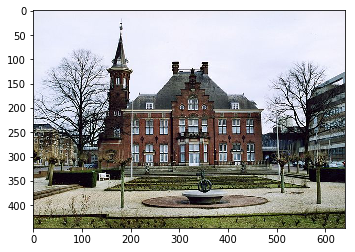

In [2]:
#!wget https://upload.wikimedia.org/wikipedia/commons/thumb/9/9e/Heyendaal.jpg/640px-Heyendaal.jpg
content_image = scipy.misc.imread("640px-Heyendaal.jpg")
plt.imshow(content_image)
scipy.misc.imsave('content_img_gogh.jpg',content_image)

** 3.1.1 - How do you ensure the generated image G matches the content of the image C?**

As we saw in lecture, the earlier (shallower) layers of a ConvNet tend to detect lower-level features such as edges and simple textures, and the later (deeper) layers tend to detect higher-level features such as more complex textures as well as object classes. 

We would like the "generated" image G to have similar content as the input image C. Suppose you have chosen some layer's activations to represent the content of an image. In practice, you'll get the most visually pleasing results if you choose a layer in the middle of the network--neither too shallow nor too deep. (After you have finished this exercise, feel free to come back and experiment with using different layers, to see how the results vary.)

So, suppose you have picked one particular hidden layer to use. Now, set the image C as the input to the pretrained VGG network, and run forward propagation. Let $a^{(C)}$ be the hidden layer activations in the layer you had chosen. This will be a $n_H \times n_W \times n_C$ tensor. Repeat this process with the image G: Set G as the input, and run forward progation. Let $a^{(G)}$ be the corresponding hidden layer activation. We will define as the content cost function as:

$$J_{content}(C,G) =  \frac{1}{4 \times n_H \times n_W \times n_C}\sum _{ \text{all entries}} (a^{(C)} - a^{(G)})^2\tag{1} $$

Here, $n_H, n_W$ and $n_C$ are the height, width and number of channels of the hidden layer you have chosen, and appear in a normalization term in the cost. For clarity, note that $a^{(C)}$ and $a^{(G)}$ are the volumes corresponding to a hidden layer's activations. In order to compute the cost $J_{content}(C,G)$, it might also be convenient to unroll these 3D volumes into a 2D matrix, as shown below. (Technically this unrolling step isn't needed to compute $J_{content}$, but it will be good practice for when you do need to carry out a similar operation later for computing the style const $J_{style}$.)

<img src="https://i.postimg.cc/YqbBM5jM/NST-LOSS.png">



**Exercise (10 points)**

Compute the "content cost" using Chainer. 

**Instructions**: The 3 steps to implement this function are:
1. Retrieve dimensions from a_G.
2. Unroll a_C and a_G.
3. Compute the content cost.

In [3]:
def compute_content_cost(a_C, a_G):
    """
    Computes the content cost
    
    Arguments:
    a_C -- tensor of dimension (1, n_C, n_H, n_W), hidden layer activations representing content of the image C 
    a_G -- tensor of dimension (1, n_C, n_H, n_W), hidden layer activations representing content of the image G
    
    Returns: 
    J_content -- scalar that you compute using equation 1 above.
    """
    
    ### START CODE HERE ###
    # retrieve dimensions of hidden layer activations
    n_C,n_H,n_W = a_G.shape;
    # unroll a_C and a_G

    a_C_2d = F.reshape(a_C,[n_C,n_H*n_W]);
    a_G_2d = F.reshape(a_G,[n_C,n_H*n_W]);

    J_content = (1/(4*n_H*n_W*n_C))*F.sum(F.square(a_C_2d - a_G_2d))

    ### END CODE HERE ###
    
    return J_content

### 3.2 - Computing the style cost

For our running example, we will use the following style image: 

c:\users\avajang-pc\appdata\local\programs\python\python35\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  
c:\users\avajang-pc\appdata\local\programs\python\python35\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.
  after removing the cwd from sys.path.


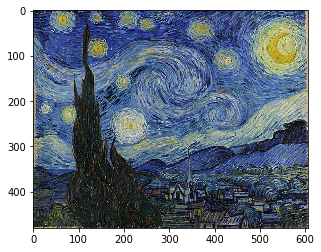

In [4]:
#!wget https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/606px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg
style_image = scipy.misc.imread("606px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg")
plt.imshow(style_image)
scipy.misc.imsave('style_img_Van_Gogh.jpg',style_image)

### 3.2.1 - Style matrix

The style matrix is also called a "Gram matrix." In linear algebra, the Gram matrix G of a set of vectors $(v_{1},\dots ,v_{n})$ is the matrix of dot products, whose entries are ${\displaystyle G_{ij} = v_{i}^T v_{j} = np.dot(v_{i}, v_{j})  }$. In other words, $G_{ij}$ compares how similar $v_i$ is to $v_j$: If they are highly similar, you would expect them to have a large dot product, and thus for $G_{ij}$ to be large. 

Note that there is an unfortunate collision in the variable names used here. We are following common terminology used in the literature, but $G$ is used to denote the Style matrix (or Gram matrix) as well as to denote the generated image $G$. We will try to make sure which $G$ we are referring to is always clear from the context. 

In NST, you can compute the Style matrix by multiplying the "unrolled" filter matrix with their transpose:

<img src="https://i.postimg.cc/Fzx5fqZb/NST-GM.png">

The result is a matrix of dimension $(n_C,n_C)$ where $n_C$ is the number of filters. The value $G_{ij}$ measures how similar the activations of filter $i$ are to the activations of filter $j$. 

One important part of the gram matrix is that the diagonal elements such as $G_{ii}$ also measures how active filter $i$ is. For example, suppose filter $i$ is detecting vertical textures in the image. Then $G_{ii}$ measures how common  vertical textures are in the image as a whole: If $G_{ii}$ is large, this means that the image has a lot of vertical texture. 

By capturing the prevalence of different types of features ($G_{ii}$), as well as how much different features occur together ($G_{ij}$), the Style matrix $G$ measures the style of an image. 



**Exercise (10 points)**:
Using Chainer, implement a function that computes the Gram matrix of a matrix A. The formula is: The gram matrix of A is $G_A = AA^T$.

In [5]:
def gram_matrix(A):
    """
    Argument:
    A -- matrix of shape (n_C, n_H*n_W)
    
    Returns:
    GA -- Gram matrix of A, of shape (n_C, n_C)
    """
    
    ### START CODE HERE ###
    A_trans = F.transpose(A)
    GA = F.matmul(A,A_trans)
    
    ### END CODE HERE ###
    
    return GA

### 3.2.2 - Style cost

After generating the Style matrix (Gram matrix), your goal will be to minimize the distance between the Gram matrix of the "style" image S and that of the "generated" image G. For now, we are using only a single hidden layer $a^{[l]}$, and the corresponding style cost for this layer is defined as: 

$$J_{style}^{[l]}(S,G) = \frac{1}{4 \times {n_C}^2 \times (n_H \times n_W)^2} \sum _{i=1}^{n_C}\sum_{j=1}^{n_C}(G^{(S)}_{ij} - G^{(G)}_{ij})^2\tag{2} $$

where $G^{(S)}$ and $G^{(G)}$ are respectively the Gram matrices of the "style" image and the "generated" image, computed using the hidden layer activations for a particular hidden layer in the network.  


**Exercise (10 points)**:

Compute the style cost for a single layer. 

The 3 steps to implement this function are:
1. Retrieve dimensions from the hidden layer activations a_G
2. Unroll the hidden layer activations a_S and a_G into 2D matrices, as explained in the picture above.
3. Compute the Style matrix of the images S and G. (Use the function you had previously written.) 
4. Compute the Style cost.

In [6]:
def compute_layer_style_cost(a_S, a_G):
    """
    Arguments:
    a_S -- tensor of dimension (1, n_C, n_H, n_W), hidden layer activations representing style of the image S 
    a_G -- tensor of dimension (1, n_C, n_H, n_W), hidden layer activations representing style of the image G
    
    Returns: 
    J_style_layer -- tensor representing a scalar value, style cost defined above by equation (2)
    """
    
    ### START CODE HERE ###
    
    # 1. retreive dimensions from a_G
    n_C,n_H,n_W = a_G.shape
    
    # 2. unroll the tensor
    a_S_2d = F.reshape(a_S,[n_C,n_H*n_W])
    a_G_2d = F.reshape(a_G,[n_C,n_H*n_W])  
    # 3 & 4. compute the style matrix and style cost 
    a_S_2d =gram_matrix(a_S_2d)
    #print(a_S_2d.shape)
    a_G_2d = gram_matrix(a_G_2d)
    #print(a_G_2d.shape)
    J_style_layer = F.sum(F.square(a_S_2d - a_G_2d)) / (4 * (n_C* n_W * n_H)**2)
    ### END CODE HERE ###
    
    return J_style_layer

### 3.2.3 Style Weights

So far you have captured the style from only one layer. We'll get better results if we "merge" style costs from several different layers. After completing this exercise, feel free to come back and experiment with different weights to see how it changes the generated image $G$. But for now, this is a pretty reasonable default: 

In [7]:
STYLE_LAYERS = [
    ('conv1_1', 0.2),
    ('conv2_1', 0.2),
    ('conv3_1', 0.2),
    ('conv4_1', 0.2),
    ('conv5_1', 0.2)]


style=[]
for i in range(0,5):
    style.append(STYLE_LAYERS[i][0])
print(style)

['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1', 'conv5_1']


You can combine the style costs for different layers as follows:

$$J_{style}(S,G) = \sum_{l} \lambda^{[l]} J^{[l]}_{style}(S,G)$$

where the values for $\lambda^{[l]}$ are given in `STYLE_LAYERS`. 


**Exercise (10 points)**

Implement the `compute_style_cost(...)` function. It should simply call the `compute_layer_style_cost(...)` several times, and weight their results using the values in `STYLE_LAYERS`.

In [8]:

def compute_style_cost(STYLE_LAYERS,input_image,style_image):
    """
    Computes the overall style cost from several chosen layers
    
    Arguments:
    model -- our tensorflow model
    STYLE_LAYERS -- A python list containing:
                        - the names of the layers we would like to extract style from
                        - a coefficient for each of them
    
    Returns: 
    J_style -- tensor representing a scalar value, style cost defined above by equation (2)
    """
    
    ### START CODE HERE ###
    L = len(STYLE_LAYERS)
    G = input_image
    S = style_image
    J_style_final=0
    for i in range(0,L):
        layersname=STYLE_LAYERS[i][0]
        gen_input=G[layersname][0]
        style_input = S[layersname][0]
        weights=STYLE_LAYERS[i][1]
        J_style_final += weights*compute_layer_style_cost(gen_input,style_input)

    return J_style_final

Finally, let's create a cost function that minimizes both the style and the content cost. The formula is: 

$$J(G) = \alpha J_{content}(C,G) + \beta J_{style}(S,G)$$

**Exercise (10 points)**

Implement the total cost function which includes both the content cost and the style cost.

In [9]:
def total_cost(J_content, J_style, alpha = 10, beta = 40):
    """
    Computes the total cost function
    
    Arguments:
    J_content -- content cost coded above
    J_style -- style cost coded above
    alpha -- hyperparameter weighting the importance of the content cost
    beta -- hyperparameter weighting the importance of the style cost
    
    Returns:
    J -- total cost as defined by the formula above.
    """
    
    ### START CODE HERE ###
    J = alpha*J_content + beta*J_style
    ### END CODE HERE ###
    
    return J

In [10]:
def generate_noise_image(content_image, noise_ratio = NOISE_RATIO):
    """
    Returns a noise image intermixed with the content image at a certain ratio.
    """
    noise_image = np.random.random(content_image.shape)
    # White noise image from the content representation. Take a weighted average
    # of the values
    input_image = (noise_image * noise_ratio + content_image * (1 - noise_ratio)).astype(np.float32)
    return input_image

## 4 - Solving the optimization problem (50 points)

Finally, let's put everything together to implement Neural Style Transfer!


Here's what the program will have to do:
<font color='purple'>

1. Load the content image 
2. Load the style image
3. Randomly initialize the image to be generated 
4. Load the VGG16 model
5. Build a Chainer Model:
    6. Run the content image through the VGG16 model and compute the content cost
    7. Run the style image through the VGG16 model and compute the style cost
    8. Compute the total cost
    9. Define the optimizer and the learning rate
10. Initialize the Chainer model and run it for a large number of iterations, updating the generated image at every step.

Let's load, reshape, and normalize our "content" image (the Louvre museum picture):

In [22]:
import gc

class Loss(object):
    def __init__(self):
        pass

    def __call__(self, content_orig, style_orig, generated_orig, STYLE_LAYERS,layer_name='conv3_1'):

        generated_orig_style = generated_orig[layer_name][0]
        J_content = compute_content_cost(content_orig, generated_orig_style)
        J_style = compute_style_cost( STYLE_LAYERS, style_orig, generated_orig)
        J = total_cost(J_content, J_style)
        print(J)
        return J

# TIP: How to make generated image model parameter
class Model (Chain):
    
    gc.enable()
    
    def __init__(self, generated_image):
        super().__init__()
        with self.init_scope():
            self.generated_image = chainer.Parameter(generated_image)
            
    def __call__(self):
        return self.generated_image

    
class Generate_Image(Chain):
    def __init__(self, generated_image):
        super().__init__()
        with self.init_scope():
            
            self.vgg=VGG()
            self.model=Model(generated_image)
            self.loss=Loss()
            self.optimizer = optimizers.Adam(alpha=2.0)
            self.optimizer.setup(self.model)
            
    def __call__(self,x,style_layer):
        
        y = self.model.forward(x,style_layer)
        
        return y
    
    def gen_img(self,content_image,style_image,style_layer,layer_name,max_iter):
        
        content_orig = self.vgg.forward(cp.array(content_image, dtype=np.float32),style_layer)
        style_orig = self.vgg.forward(cp.array(style_image, dtype=np.float32),style_layer)
        self.vgg.disable_update()
        loss_history=[]
        means = np.array([116.779,116.779,116.779], dtype=np.float32).reshape((3,1,1)) #means from vgg model
        for i in range(max_iter):       
            x = self.model()
            generated_orig=self.vgg(x,style_layer)

            cost=self.loss( content_orig[layer_name][0], style_orig, generated_orig, STYLE_LAYERS)

            self.model.cleargrads()
            cost.backward()
            self.optimizer.update()
            tmp_shape = x.data.shape
            
            xp = self.model.xp
            if i%1==0:
                print(i)
                print('cost')
                print(cost)
                
            loss_history.append(float(cost.data))
        
            #IPython.display.clear_output()
            print('iteration: {:3d} / {:03d}, loss: {:.4f}'.format(i+1, max_iter, loss_history[-1]))
            if i % 50 == 0:
                plt.plot(np.array(loss_history).reshape(i + 1, -1).mean(1))
                plt.xlabel('iteration')
                plt.ylabel('training loss')
                plt.tight_layout()
                plt.show()
            #xp = model.xp
            x_out = x.data[0] 
            x_out = cp.asnumpy(x_out)
            x_out = x_out + np.moveaxis(means, 0, 0)
            if i % 20 == 0:
                plt.imshow(np.moveaxis(x_out.astype(np.int64), 0, -1))
                plt.show()
            if i % 100 == 0:
                result = Image.fromarray((np.moveaxis(x_out.astype(np.int64), 0, -1) * 255).astype(np.uint8))
                result.save('generated.png')
                
                gc.collect()
                
        return 
    
class VGG(Chain):
    def __init__(self):
        super(VGG, self).__init__()
        with self.init_scope():
            self.model=chainer.links.VGG19Layers()

    def forward(self, x,style):
        y = self.model.forward(x,layers=style)
        return y

In [17]:

def subtract_mean(x0):
    x = x0.copy()
    x[0,0,:,:] -= 116.779
    x[0,1,:,:] -= 116.779
    x[0,2,:,:] -= 116.779
    #means = np.array([116.779,116.779,116.779], dtype=np.float32).reshape((3,1,1))
    return x

def image_resize(img_file, width=224):
    img = img_file
    orig_w, orig_h = img.size[0], img.size[1]
    if orig_w>orig_h:
        new_w = width
        new_h = width*orig_h//orig_w
        img = np.asarray(img.resize((new_w,new_h)))[:,:,:3].transpose(2, 0, 1)[::-1].astype(np.float32)
        img = img.reshape((1,3,new_h,new_w))
        hoge= np.zeros((1,3,width,width), dtype=np.float32)
        hoge[0,:,width-new_h:,:] = img[0,:,:,:]
        img = subtract_mean(hoge)
    else:
        new_w = width*orig_w//orig_h
        new_h = width
        img = np.asarray(img.resize((new_w,new_h)))[:,:,:3].transpose(2, 0, 1)[::-1].astype(np.float32)
        img = img.reshape((1,3,new_h,new_w))
        hoge= np.zeros((1,3,width,width), dtype=np.float32)
        hoge[0,:,:,width-new_w:] = img[0,:,:,:]
        img = subtract_mean(hoge)
    return np.asarray(img), new_w, new_h

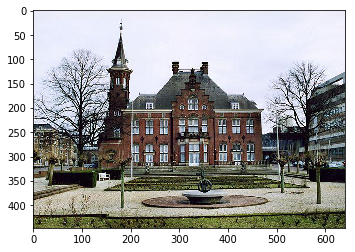

In [18]:
#from chainer.links import VGG16Layers
#path=''
cnt_image = 'content_img_gogh.jpg'
st_image = 'style_img_Van_Gogh.jpg'

# 1. Load the content image
im = Image.open(cnt_image)
im.save('content_img_gogh.png')
im_content=Image.open('content_img_gogh.png')
imshow(im_content)
content_image,nw,nh=image_resize(im_content)

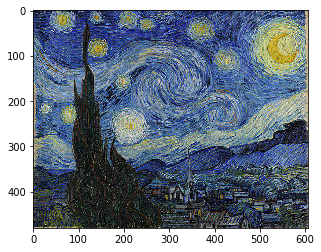

In [19]:
# 2. Load the style image

im = Image.open(st_image)
im.save('style_img_gogh.png')
im_style=Image.open('style_img_gogh.png')
imshow(im_style)
style_image,_,_ = image_resize(im_style)
 
# 3. Randomly initialize the image to be generated 
generated_image=generate_noise_image(content_image)

In [23]:
# 5. Build a Chainer Model:

layer_name='conv3_1'
loss_history = []
model_directory = "Models"
lr=2.0 #learning rate
model=Generate_Image(generated_image)
model.vgg.to_gpu(0)

max_iter=1000



variable(5.3335412e+11)
0
cost
variable(5.3335412e+11)
iteration:   1 / 1000, loss: 533354119168.0000


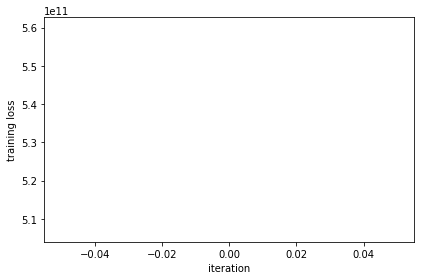

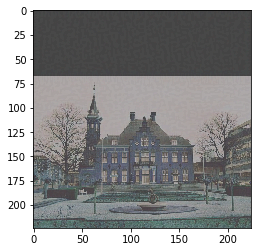

variable(4.6419375e+11)
1
cost
variable(4.6419375e+11)
iteration:   2 / 1000, loss: 464193748992.0000
variable(3.9160873e+11)
2
cost
variable(3.9160873e+11)
iteration:   3 / 1000, loss: 391608729600.0000
variable(3.2175387e+11)
3
cost
variable(3.2175387e+11)
iteration:   4 / 1000, loss: 321753874432.0000
variable(2.572787e+11)
4
cost
variable(2.572787e+11)
iteration:   5 / 1000, loss: 257278705664.0000
variable(2.0114319e+11)
5
cost
variable(2.0114319e+11)
iteration:   6 / 1000, loss: 201143189504.0000
variable(1.554708e+11)
6
cost
variable(1.554708e+11)
iteration:   7 / 1000, loss: 155470807040.0000
variable(1.21160565e+11)
7
cost
variable(1.21160565e+11)
iteration:   8 / 1000, loss: 121160564736.0000
variable(9.8079e+10)
8
cost
variable(9.8079e+10)
iteration:   9 / 1000, loss: 98078998528.0000
variable(8.483589e+10)
9
cost
variable(8.483589e+10)
iteration:  10 / 1000, loss: 84835893248.0000
variable(7.825386e+10)
10
cost
variable(7.825386e+10)
iteration:  11 / 1000, loss: 78253858816

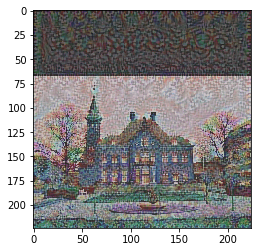

variable(2.9295888e+10)
21
cost
variable(2.9295888e+10)
iteration:  22 / 1000, loss: 29295888384.0000
variable(2.757773e+10)
22
cost
variable(2.757773e+10)
iteration:  23 / 1000, loss: 27577729024.0000
variable(2.6127751e+10)
23
cost
variable(2.6127751e+10)
iteration:  24 / 1000, loss: 26127751168.0000
variable(2.4891916e+10)
24
cost
variable(2.4891916e+10)
iteration:  25 / 1000, loss: 24891916288.0000
variable(2.3825097e+10)
25
cost
variable(2.3825097e+10)
iteration:  26 / 1000, loss: 23825096704.0000
variable(2.289089e+10)
26
cost
variable(2.289089e+10)
iteration:  27 / 1000, loss: 22890889216.0000
variable(2.2047732e+10)
27
cost
variable(2.2047732e+10)
iteration:  28 / 1000, loss: 22047731712.0000
variable(2.1283052e+10)
28
cost
variable(2.1283052e+10)
iteration:  29 / 1000, loss: 21283051520.0000
variable(2.058257e+10)
29
cost
variable(2.058257e+10)
iteration:  30 / 1000, loss: 20582569984.0000
variable(1.9927726e+10)
30
cost
variable(1.9927726e+10)
iteration:  31 / 1000, loss: 199

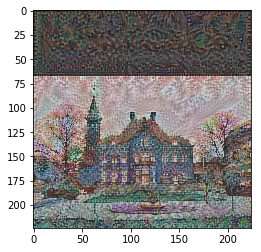

variable(1.4204106e+10)
41
cost
variable(1.4204106e+10)
iteration:  42 / 1000, loss: 14204105728.0000
variable(1.3837349e+10)
42
cost
variable(1.3837349e+10)
iteration:  43 / 1000, loss: 13837348864.0000
variable(1.3492261e+10)
43
cost
variable(1.3492261e+10)
iteration:  44 / 1000, loss: 13492260864.0000
variable(1.3166234e+10)
44
cost
variable(1.3166234e+10)
iteration:  45 / 1000, loss: 13166233600.0000
variable(1.2858029e+10)
45
cost
variable(1.2858029e+10)
iteration:  46 / 1000, loss: 12858029056.0000
variable(1.2563949e+10)
46
cost
variable(1.2563949e+10)
iteration:  47 / 1000, loss: 12563948544.0000
variable(1.2279357e+10)
47
cost
variable(1.2279357e+10)
iteration:  48 / 1000, loss: 12279357440.0000
variable(1.2005501e+10)
48
cost
variable(1.2005501e+10)
iteration:  49 / 1000, loss: 12005500928.0000
variable(1.1742868e+10)
49
cost
variable(1.1742868e+10)
iteration:  50 / 1000, loss: 11742868480.0000
variable(1.1490542e+10)
50
cost
variable(1.1490542e+10)
iteration:  51 / 1000, los

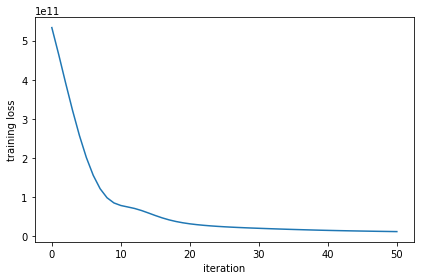

variable(1.1248853e+10)
51
cost
variable(1.1248853e+10)
iteration:  52 / 1000, loss: 11248852992.0000
variable(1.1018694e+10)
52
cost
variable(1.1018694e+10)
iteration:  53 / 1000, loss: 11018693632.0000
variable(1.0801384e+10)
53
cost
variable(1.0801384e+10)
iteration:  54 / 1000, loss: 10801384448.0000
variable(1.0594916e+10)
54
cost
variable(1.0594916e+10)
iteration:  55 / 1000, loss: 10594916352.0000
variable(1.0392868e+10)
55
cost
variable(1.0392868e+10)
iteration:  56 / 1000, loss: 10392867840.0000
variable(1.0193016e+10)
56
cost
variable(1.0193016e+10)
iteration:  57 / 1000, loss: 10193015808.0000
variable(9.998433e+09)
57
cost
variable(9.998433e+09)
iteration:  58 / 1000, loss: 9998433280.0000
variable(9.813491e+09)
58
cost
variable(9.813491e+09)
iteration:  59 / 1000, loss: 9813490688.0000
variable(9.638767e+09)
59
cost
variable(9.638767e+09)
iteration:  60 / 1000, loss: 9638766592.0000
variable(9.470363e+09)
60
cost


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(9.470363e+09)
iteration:  61 / 1000, loss: 9470362624.0000


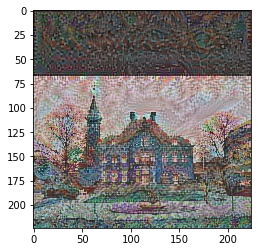

variable(9.304657e+09)
61
cost
variable(9.304657e+09)
iteration:  62 / 1000, loss: 9304656896.0000
variable(9.14202e+09)
62
cost
variable(9.14202e+09)
iteration:  63 / 1000, loss: 9142020096.0000
variable(8.984214e+09)
63
cost
variable(8.984214e+09)
iteration:  64 / 1000, loss: 8984213504.0000
variable(8.83435e+09)
64
cost
variable(8.83435e+09)
iteration:  65 / 1000, loss: 8834350080.0000
variable(8.691721e+09)
65
cost
variable(8.691721e+09)
iteration:  66 / 1000, loss: 8691721216.0000
variable(8.553269e+09)
66
cost
variable(8.553269e+09)
iteration:  67 / 1000, loss: 8553269248.0000
variable(8.4177807e+09)
67
cost
variable(8.4177807e+09)
iteration:  68 / 1000, loss: 8417780736.0000
variable(8.2871977e+09)
68
cost
variable(8.2871977e+09)
iteration:  69 / 1000, loss: 8287197696.0000
variable(8.161697e+09)
69
cost
variable(8.161697e+09)
iteration:  70 / 1000, loss: 8161696768.0000
variable(8.040962e+09)
70
cost
variable(8.040962e+09)
iteration:  71 / 1000, loss: 8040962048.0000
variable(7

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(7.0276454e+09)
iteration:  81 / 1000, loss: 7027645440.0000


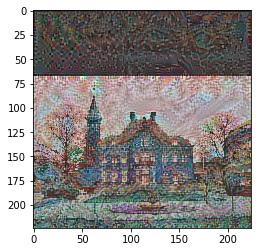

variable(6.9405496e+09)
81
cost
variable(6.9405496e+09)
iteration:  82 / 1000, loss: 6940549632.0000
variable(6.854841e+09)
82
cost
variable(6.854841e+09)
iteration:  83 / 1000, loss: 6854840832.0000
variable(6.7711933e+09)
83
cost
variable(6.7711933e+09)
iteration:  84 / 1000, loss: 6771193344.0000
variable(6.689765e+09)
84
cost
variable(6.689765e+09)
iteration:  85 / 1000, loss: 6689764864.0000
variable(6.6099057e+09)
85
cost
variable(6.6099057e+09)
iteration:  86 / 1000, loss: 6609905664.0000
variable(6.531671e+09)
86
cost
variable(6.531671e+09)
iteration:  87 / 1000, loss: 6531671040.0000
variable(6.4547686e+09)
87
cost
variable(6.4547686e+09)
iteration:  88 / 1000, loss: 6454768640.0000
variable(6.3794386e+09)
88
cost
variable(6.3794386e+09)
iteration:  89 / 1000, loss: 6379438592.0000
variable(6.3054356e+09)
89
cost
variable(6.3054356e+09)
iteration:  90 / 1000, loss: 6305435648.0000
variable(6.2333005e+09)
90
cost
variable(6.2333005e+09)
iteration:  91 / 1000, loss: 6233300480.0

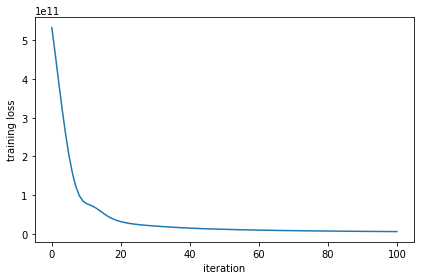

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


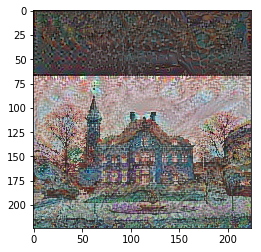

variable(5.5424415e+09)
101
cost
variable(5.5424415e+09)
iteration: 102 / 1000, loss: 5542441472.0000
variable(5.486778e+09)
102
cost
variable(5.486778e+09)
iteration: 103 / 1000, loss: 5486777856.0000
variable(5.4320824e+09)
103
cost
variable(5.4320824e+09)
iteration: 104 / 1000, loss: 5432082432.0000
variable(5.378922e+09)
104
cost
variable(5.378922e+09)
iteration: 105 / 1000, loss: 5378921984.0000
variable(5.3265495e+09)
105
cost
variable(5.3265495e+09)
iteration: 106 / 1000, loss: 5326549504.0000
variable(5.275216e+09)
106
cost
variable(5.275216e+09)
iteration: 107 / 1000, loss: 5275215872.0000
variable(5.2253225e+09)
107
cost
variable(5.2253225e+09)
iteration: 108 / 1000, loss: 5225322496.0000
variable(5.1765325e+09)
108
cost
variable(5.1765325e+09)
iteration: 109 / 1000, loss: 5176532480.0000
variable(5.128775e+09)
109
cost
variable(5.128775e+09)
iteration: 110 / 1000, loss: 5128775168.0000
variable(5.0821463e+09)
110
cost
variable(5.0821463e+09)
iteration: 111 / 1000, loss: 5082

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(4.6703094e+09)
iteration: 121 / 1000, loss: 4670309376.0000


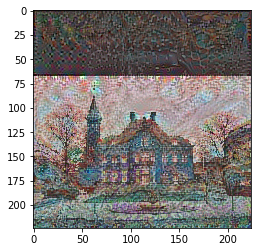

variable(4.633628e+09)
121
cost
variable(4.633628e+09)
iteration: 122 / 1000, loss: 4633628160.0000
variable(4.5974456e+09)
122
cost
variable(4.5974456e+09)
iteration: 123 / 1000, loss: 4597445632.0000
variable(4.561833e+09)
123
cost
variable(4.561833e+09)
iteration: 124 / 1000, loss: 4561832960.0000
variable(4.5272934e+09)
124
cost
variable(4.5272934e+09)
iteration: 125 / 1000, loss: 4527293440.0000
variable(4.4932547e+09)
125
cost
variable(4.4932547e+09)
iteration: 126 / 1000, loss: 4493254656.0000
variable(4.459814e+09)
126
cost
variable(4.459814e+09)
iteration: 127 / 1000, loss: 4459813888.0000
variable(4.427071e+09)
127
cost
variable(4.427071e+09)
iteration: 128 / 1000, loss: 4427070976.0000
variable(4.3950095e+09)
128
cost
variable(4.3950095e+09)
iteration: 129 / 1000, loss: 4395009536.0000
variable(4.363639e+09)
129
cost
variable(4.363639e+09)
iteration: 130 / 1000, loss: 4363638784.0000
variable(4.333079e+09)
130
cost
variable(4.333079e+09)
iteration: 131 / 1000, loss: 43330790

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(4.0601818e+09)
iteration: 141 / 1000, loss: 4060181760.0000


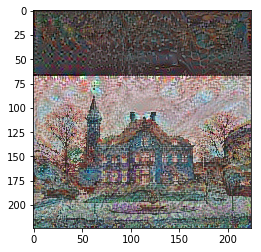

variable(4.0352727e+09)
141
cost
variable(4.0352727e+09)
iteration: 142 / 1000, loss: 4035272704.0000
variable(4.0108193e+09)
142
cost
variable(4.0108193e+09)
iteration: 143 / 1000, loss: 4010819328.0000
variable(3.9866813e+09)
143
cost
variable(3.9866813e+09)
iteration: 144 / 1000, loss: 3986681344.0000
variable(3.9628465e+09)
144
cost
variable(3.9628465e+09)
iteration: 145 / 1000, loss: 3962846464.0000
variable(3.939327e+09)
145
cost
variable(3.939327e+09)
iteration: 146 / 1000, loss: 3939326976.0000
variable(3.9159946e+09)
146
cost
variable(3.9159946e+09)
iteration: 147 / 1000, loss: 3915994624.0000
variable(3.8929746e+09)
147
cost
variable(3.8929746e+09)
iteration: 148 / 1000, loss: 3892974592.0000
variable(3.8702994e+09)
148
cost
variable(3.8702994e+09)
iteration: 149 / 1000, loss: 3870299392.0000
variable(3.8478723e+09)
149
cost
variable(3.8478723e+09)
iteration: 150 / 1000, loss: 3847872256.0000
variable(3.825663e+09)
150
cost
variable(3.825663e+09)
iteration: 151 / 1000, loss: 

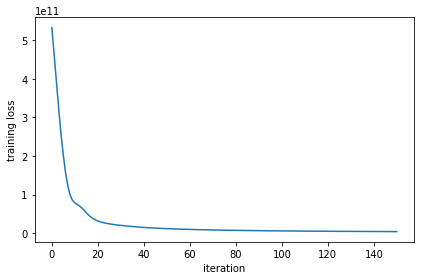

variable(3.8039086e+09)
151
cost
variable(3.8039086e+09)
iteration: 152 / 1000, loss: 3803908608.0000
variable(3.7826286e+09)
152
cost
variable(3.7826286e+09)
iteration: 153 / 1000, loss: 3782628608.0000
variable(3.7616212e+09)
153
cost
variable(3.7616212e+09)
iteration: 154 / 1000, loss: 3761621248.0000
variable(3.7407427e+09)
154
cost
variable(3.7407427e+09)
iteration: 155 / 1000, loss: 3740742656.0000
variable(3.7199818e+09)
155
cost
variable(3.7199818e+09)
iteration: 156 / 1000, loss: 3719981824.0000
variable(3.6996352e+09)
156
cost
variable(3.6996352e+09)
iteration: 157 / 1000, loss: 3699635200.0000
variable(3.6795648e+09)
157
cost
variable(3.6795648e+09)
iteration: 158 / 1000, loss: 3679564800.0000
variable(3.659926e+09)
158
cost
variable(3.659926e+09)
iteration: 159 / 1000, loss: 3659926016.0000
variable(3.6404209e+09)
159
cost
variable(3.6404209e+09)
iteration: 160 / 1000, loss: 3640420864.0000
variable(3.6210988e+09)
160
cost


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(3.6210988e+09)
iteration: 161 / 1000, loss: 3621098752.0000


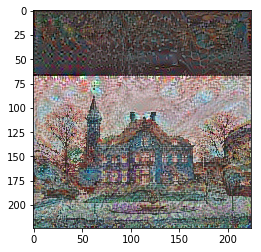

variable(3.6021422e+09)
161
cost
variable(3.6021422e+09)
iteration: 162 / 1000, loss: 3602142208.0000
variable(3.5833994e+09)
162
cost
variable(3.5833994e+09)
iteration: 163 / 1000, loss: 3583399424.0000
variable(3.564901e+09)
163
cost
variable(3.564901e+09)
iteration: 164 / 1000, loss: 3564901120.0000
variable(3.5466627e+09)
164
cost
variable(3.5466627e+09)
iteration: 165 / 1000, loss: 3546662656.0000
variable(3.5286804e+09)
165
cost
variable(3.5286804e+09)
iteration: 166 / 1000, loss: 3528680448.0000
variable(3.5108268e+09)
166
cost
variable(3.5108268e+09)
iteration: 167 / 1000, loss: 3510826752.0000
variable(3.4933542e+09)
167
cost
variable(3.4933542e+09)
iteration: 168 / 1000, loss: 3493354240.0000
variable(3.476075e+09)
168
cost
variable(3.476075e+09)
iteration: 169 / 1000, loss: 3476075008.0000
variable(3.4589082e+09)
169
cost
variable(3.4589082e+09)
iteration: 170 / 1000, loss: 3458908160.0000
variable(3.4421266e+09)
170
cost
variable(3.4421266e+09)
iteration: 171 / 1000, loss: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(3.2846858e+09)
iteration: 181 / 1000, loss: 3284685824.0000


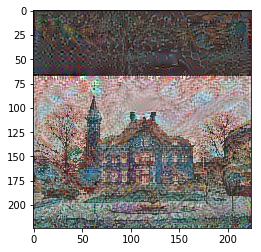

variable(3.2700042e+09)
181
cost
variable(3.2700042e+09)
iteration: 182 / 1000, loss: 3270004224.0000
variable(3.2555584e+09)
182
cost
variable(3.2555584e+09)
iteration: 183 / 1000, loss: 3255558400.0000
variable(3.2411318e+09)
183
cost
variable(3.2411318e+09)
iteration: 184 / 1000, loss: 3241131776.0000
variable(3.2270446e+09)
184
cost
variable(3.2270446e+09)
iteration: 185 / 1000, loss: 3227044608.0000
variable(3.2131855e+09)
185
cost
variable(3.2131855e+09)
iteration: 186 / 1000, loss: 3213185536.0000
variable(3.1992146e+09)
186
cost
variable(3.1992146e+09)
iteration: 187 / 1000, loss: 3199214592.0000
variable(3.1853407e+09)
187
cost
variable(3.1853407e+09)
iteration: 188 / 1000, loss: 3185340672.0000
variable(3.1717253e+09)
188
cost
variable(3.1717253e+09)
iteration: 189 / 1000, loss: 3171725312.0000
variable(3.1582172e+09)
189
cost
variable(3.1582172e+09)
iteration: 190 / 1000, loss: 3158217216.0000
variable(3.1449183e+09)
190
cost
variable(3.1449183e+09)
iteration: 191 / 1000, lo

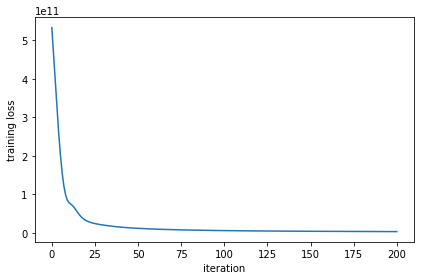

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


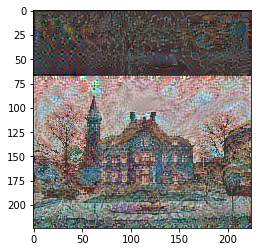

variable(3.006805e+09)
201
cost
variable(3.006805e+09)
iteration: 202 / 1000, loss: 3006804992.0000
variable(2.9948296e+09)
202
cost
variable(2.9948296e+09)
iteration: 203 / 1000, loss: 2994829568.0000
variable(2.9829814e+09)
203
cost
variable(2.9829814e+09)
iteration: 204 / 1000, loss: 2982981376.0000
variable(2.9711562e+09)
204
cost
variable(2.9711562e+09)
iteration: 205 / 1000, loss: 2971156224.0000
variable(2.959696e+09)
205
cost
variable(2.959696e+09)
iteration: 206 / 1000, loss: 2959695872.0000
variable(2.9482624e+09)
206
cost
variable(2.9482624e+09)
iteration: 207 / 1000, loss: 2948262400.0000
variable(2.9368717e+09)
207
cost
variable(2.9368717e+09)
iteration: 208 / 1000, loss: 2936871680.0000
variable(2.9256394e+09)
208
cost
variable(2.9256394e+09)
iteration: 209 / 1000, loss: 2925639424.0000
variable(2.9144824e+09)
209
cost
variable(2.9144824e+09)
iteration: 210 / 1000, loss: 2914482432.0000
variable(2.903478e+09)
210
cost
variable(2.903478e+09)
iteration: 211 / 1000, loss: 29

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(2.7976742e+09)
iteration: 221 / 1000, loss: 2797674240.0000


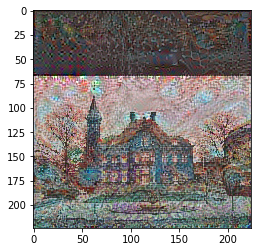

variable(2.7876416e+09)
221
cost
variable(2.7876416e+09)
iteration: 222 / 1000, loss: 2787641600.0000
variable(2.7776835e+09)
222
cost
variable(2.7776835e+09)
iteration: 223 / 1000, loss: 2777683456.0000
variable(2.7678725e+09)
223
cost
variable(2.7678725e+09)
iteration: 224 / 1000, loss: 2767872512.0000
variable(2.758066e+09)
224
cost
variable(2.758066e+09)
iteration: 225 / 1000, loss: 2758065920.0000
variable(2.7485225e+09)
225
cost
variable(2.7485225e+09)
iteration: 226 / 1000, loss: 2748522496.0000
variable(2.738968e+09)
226
cost
variable(2.738968e+09)
iteration: 227 / 1000, loss: 2738968064.0000
variable(2.7293699e+09)
227
cost
variable(2.7293699e+09)
iteration: 228 / 1000, loss: 2729369856.0000
variable(2.7199327e+09)
228
cost
variable(2.7199327e+09)
iteration: 229 / 1000, loss: 2719932672.0000
variable(2.7106068e+09)
229
cost
variable(2.7106068e+09)
iteration: 230 / 1000, loss: 2710606848.0000
variable(2.701226e+09)
230
cost
variable(2.701226e+09)
iteration: 231 / 1000, loss: 27

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(2.6118042e+09)
iteration: 241 / 1000, loss: 2611804160.0000


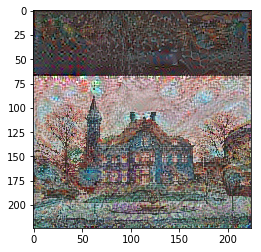

variable(2.6030932e+09)
241
cost
variable(2.6030932e+09)
iteration: 242 / 1000, loss: 2603093248.0000
variable(2.5944937e+09)
242
cost
variable(2.5944937e+09)
iteration: 243 / 1000, loss: 2594493696.0000
variable(2.586121e+09)
243
cost
variable(2.586121e+09)
iteration: 244 / 1000, loss: 2586120960.0000
variable(2.5778506e+09)
244
cost
variable(2.5778506e+09)
iteration: 245 / 1000, loss: 2577850624.0000
variable(2.5694106e+09)
245
cost
variable(2.5694106e+09)
iteration: 246 / 1000, loss: 2569410560.0000
variable(2.5612365e+09)
246
cost
variable(2.5612365e+09)
iteration: 247 / 1000, loss: 2561236480.0000
variable(2.5530834e+09)
247
cost
variable(2.5530834e+09)
iteration: 248 / 1000, loss: 2553083392.0000
variable(2.5449654e+09)
248
cost
variable(2.5449654e+09)
iteration: 249 / 1000, loss: 2544965376.0000
variable(2.5370342e+09)
249
cost
variable(2.5370342e+09)
iteration: 250 / 1000, loss: 2537034240.0000
variable(2.5291822e+09)
250
cost
variable(2.5291822e+09)
iteration: 251 / 1000, loss

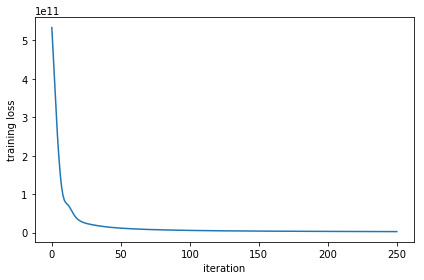

variable(2.5213962e+09)
251
cost
variable(2.5213962e+09)
iteration: 252 / 1000, loss: 2521396224.0000
variable(2.5137262e+09)
252
cost
variable(2.5137262e+09)
iteration: 253 / 1000, loss: 2513726208.0000
variable(2.5060603e+09)
253
cost
variable(2.5060603e+09)
iteration: 254 / 1000, loss: 2506060288.0000
variable(2.498413e+09)
254
cost
variable(2.498413e+09)
iteration: 255 / 1000, loss: 2498413056.0000
variable(2.490992e+09)
255
cost
variable(2.490992e+09)
iteration: 256 / 1000, loss: 2490992128.0000
variable(2.4834762e+09)
256
cost
variable(2.4834762e+09)
iteration: 257 / 1000, loss: 2483476224.0000
variable(2.4760778e+09)
257
cost
variable(2.4760778e+09)
iteration: 258 / 1000, loss: 2476077824.0000
variable(2.4687155e+09)
258
cost
variable(2.4687155e+09)
iteration: 259 / 1000, loss: 2468715520.0000
variable(2.461346e+09)
259
cost
variable(2.461346e+09)
iteration: 260 / 1000, loss: 2461346048.0000
variable(2.454076e+09)
260
cost


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(2.454076e+09)
iteration: 261 / 1000, loss: 2454075904.0000


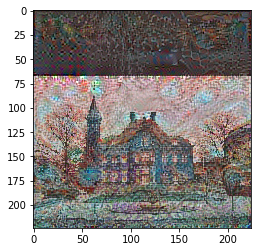

variable(2.4468252e+09)
261
cost
variable(2.4468252e+09)
iteration: 262 / 1000, loss: 2446825216.0000
variable(2.439509e+09)
262
cost
variable(2.439509e+09)
iteration: 263 / 1000, loss: 2439508992.0000
variable(2.4323894e+09)
263
cost
variable(2.4323894e+09)
iteration: 264 / 1000, loss: 2432389376.0000
variable(2.4252524e+09)
264
cost
variable(2.4252524e+09)
iteration: 265 / 1000, loss: 2425252352.0000
variable(2.418113e+09)
265
cost
variable(2.418113e+09)
iteration: 266 / 1000, loss: 2418113024.0000
variable(2.4111153e+09)
266
cost
variable(2.4111153e+09)
iteration: 267 / 1000, loss: 2411115264.0000
variable(2.404171e+09)
267
cost
variable(2.404171e+09)
iteration: 268 / 1000, loss: 2404171008.0000
variable(2.3972088e+09)
268
cost
variable(2.3972088e+09)
iteration: 269 / 1000, loss: 2397208832.0000
variable(2.3903288e+09)
269
cost
variable(2.3903288e+09)
iteration: 270 / 1000, loss: 2390328832.0000
variable(2.383399e+09)
270
cost
variable(2.383399e+09)
iteration: 271 / 1000, loss: 2383

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(2.3161475e+09)
iteration: 281 / 1000, loss: 2316147456.0000


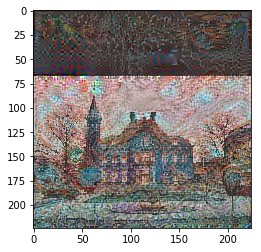

variable(2.3096087e+09)
281
cost
variable(2.3096087e+09)
iteration: 282 / 1000, loss: 2309608704.0000
variable(2.303249e+09)
282
cost
variable(2.303249e+09)
iteration: 283 / 1000, loss: 2303248896.0000
variable(2.2968525e+09)
283
cost
variable(2.2968525e+09)
iteration: 284 / 1000, loss: 2296852480.0000
variable(2.2905006e+09)
284
cost
variable(2.2905006e+09)
iteration: 285 / 1000, loss: 2290500608.0000
variable(2.2842598e+09)
285
cost
variable(2.2842598e+09)
iteration: 286 / 1000, loss: 2284259840.0000
variable(2.278058e+09)
286
cost
variable(2.278058e+09)
iteration: 287 / 1000, loss: 2278057984.0000
variable(2.27196e+09)
287
cost
variable(2.27196e+09)
iteration: 288 / 1000, loss: 2271960064.0000
variable(2.2658486e+09)
288
cost
variable(2.2658486e+09)
iteration: 289 / 1000, loss: 2265848576.0000
variable(2.2598682e+09)
289
cost
variable(2.2598682e+09)
iteration: 290 / 1000, loss: 2259868160.0000
variable(2.2537784e+09)
290
cost
variable(2.2537784e+09)
iteration: 291 / 1000, loss: 2253

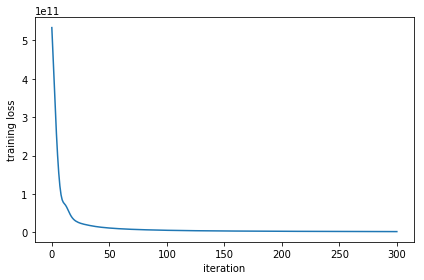

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


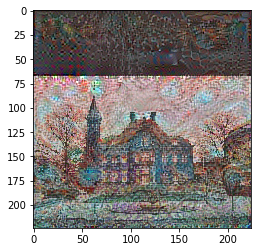

variable(2.190292e+09)
301
cost
variable(2.190292e+09)
iteration: 302 / 1000, loss: 2190291968.0000
variable(2.1846904e+09)
302
cost
variable(2.1846904e+09)
iteration: 303 / 1000, loss: 2184690432.0000
variable(2.1792046e+09)
303
cost
variable(2.1792046e+09)
iteration: 304 / 1000, loss: 2179204608.0000
variable(2.1736753e+09)
304
cost
variable(2.1736753e+09)
iteration: 305 / 1000, loss: 2173675264.0000
variable(2.1683077e+09)
305
cost
variable(2.1683077e+09)
iteration: 306 / 1000, loss: 2168307712.0000
variable(2.162975e+09)
306
cost
variable(2.162975e+09)
iteration: 307 / 1000, loss: 2162974976.0000
variable(2.1575526e+09)
307
cost
variable(2.1575526e+09)
iteration: 308 / 1000, loss: 2157552640.0000
variable(2.1522463e+09)
308
cost
variable(2.1522463e+09)
iteration: 309 / 1000, loss: 2152246272.0000
variable(2.1469795e+09)
309
cost
variable(2.1469795e+09)
iteration: 310 / 1000, loss: 2146979456.0000
variable(2.1417682e+09)
310
cost
variable(2.1417682e+09)
iteration: 311 / 1000, loss: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(2.0917462e+09)
iteration: 321 / 1000, loss: 2091746176.0000


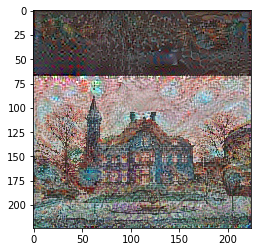

variable(2.0869565e+09)
321
cost
variable(2.0869565e+09)
iteration: 322 / 1000, loss: 2086956544.0000
variable(2.082209e+09)
322
cost
variable(2.082209e+09)
iteration: 323 / 1000, loss: 2082209024.0000
variable(2.0774364e+09)
323
cost
variable(2.0774364e+09)
iteration: 324 / 1000, loss: 2077436416.0000
variable(2.072709e+09)
324
cost
variable(2.072709e+09)
iteration: 325 / 1000, loss: 2072708992.0000
variable(2.0680763e+09)
325
cost
variable(2.0680763e+09)
iteration: 326 / 1000, loss: 2068076288.0000
variable(2.0633907e+09)
326
cost
variable(2.0633907e+09)
iteration: 327 / 1000, loss: 2063390720.0000
variable(2.0588993e+09)
327
cost
variable(2.0588993e+09)
iteration: 328 / 1000, loss: 2058899328.0000
variable(2.0542981e+09)
328
cost
variable(2.0542981e+09)
iteration: 329 / 1000, loss: 2054298112.0000
variable(2.04978e+09)
329
cost
variable(2.04978e+09)
iteration: 330 / 1000, loss: 2049779968.0000
variable(2.0452604e+09)
330
cost
variable(2.0452604e+09)
iteration: 331 / 1000, loss: 2045

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(2.0017787e+09)
iteration: 341 / 1000, loss: 2001778688.0000


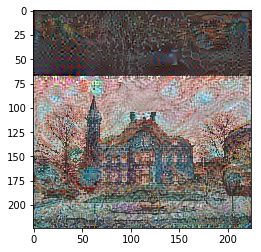

variable(1.9976474e+09)
341
cost
variable(1.9976474e+09)
iteration: 342 / 1000, loss: 1997647360.0000
variable(1.9934711e+09)
342
cost
variable(1.9934711e+09)
iteration: 343 / 1000, loss: 1993471104.0000
variable(1.9893341e+09)
343
cost
variable(1.9893341e+09)
iteration: 344 / 1000, loss: 1989334144.0000
variable(1.985213e+09)
344
cost
variable(1.985213e+09)
iteration: 345 / 1000, loss: 1985213056.0000
variable(1.9811238e+09)
345
cost
variable(1.9811238e+09)
iteration: 346 / 1000, loss: 1981123840.0000
variable(1.977098e+09)
346
cost
variable(1.977098e+09)
iteration: 347 / 1000, loss: 1977097984.0000
variable(1.9731462e+09)
347
cost
variable(1.9731462e+09)
iteration: 348 / 1000, loss: 1973146240.0000
variable(1.9690637e+09)
348
cost
variable(1.9690637e+09)
iteration: 349 / 1000, loss: 1969063680.0000
variable(1.9651602e+09)
349
cost
variable(1.9651602e+09)
iteration: 350 / 1000, loss: 1965160192.0000
variable(1.9612507e+09)
350
cost
variable(1.9612507e+09)
iteration: 351 / 1000, loss: 

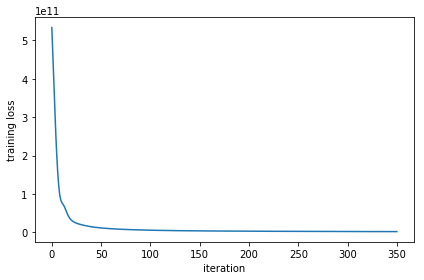

variable(1.9573344e+09)
351
cost
variable(1.9573344e+09)
iteration: 352 / 1000, loss: 1957334400.0000
variable(1.953493e+09)
352
cost
variable(1.953493e+09)
iteration: 353 / 1000, loss: 1953492992.0000
variable(1.9496058e+09)
353
cost
variable(1.9496058e+09)
iteration: 354 / 1000, loss: 1949605760.0000
variable(1.9458167e+09)
354
cost
variable(1.9458167e+09)
iteration: 355 / 1000, loss: 1945816704.0000
variable(1.942005e+09)
355
cost
variable(1.942005e+09)
iteration: 356 / 1000, loss: 1942004992.0000
variable(1.9382031e+09)
356
cost
variable(1.9382031e+09)
iteration: 357 / 1000, loss: 1938203136.0000
variable(1.9344678e+09)
357
cost
variable(1.9344678e+09)
iteration: 358 / 1000, loss: 1934467840.0000
variable(1.9308114e+09)
358
cost
variable(1.9308114e+09)
iteration: 359 / 1000, loss: 1930811392.0000
variable(1.9271379e+09)
359
cost
variable(1.9271379e+09)
iteration: 360 / 1000, loss: 1927137920.0000
variable(1.9234237e+09)
360
cost


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.9234237e+09)
iteration: 361 / 1000, loss: 1923423744.0000


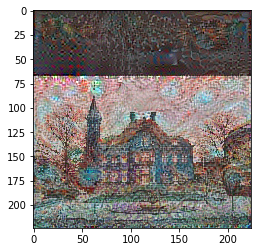

variable(1.9198316e+09)
361
cost
variable(1.9198316e+09)
iteration: 362 / 1000, loss: 1919831552.0000
variable(1.9161882e+09)
362
cost
variable(1.9161882e+09)
iteration: 363 / 1000, loss: 1916188160.0000
variable(1.9126762e+09)
363
cost
variable(1.9126762e+09)
iteration: 364 / 1000, loss: 1912676224.0000
variable(1.9090394e+09)
364
cost
variable(1.9090394e+09)
iteration: 365 / 1000, loss: 1909039360.0000
variable(1.9054336e+09)
365
cost
variable(1.9054336e+09)
iteration: 366 / 1000, loss: 1905433600.0000
variable(1.901862e+09)
366
cost
variable(1.901862e+09)
iteration: 367 / 1000, loss: 1901862016.0000
variable(1.8982977e+09)
367
cost
variable(1.8982977e+09)
iteration: 368 / 1000, loss: 1898297728.0000
variable(1.894734e+09)
368
cost
variable(1.894734e+09)
iteration: 369 / 1000, loss: 1894733952.0000
variable(1.8912242e+09)
369
cost
variable(1.8912242e+09)
iteration: 370 / 1000, loss: 1891224192.0000
variable(1.8876364e+09)
370
cost
variable(1.8876364e+09)
iteration: 371 / 1000, loss: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.8535377e+09)
iteration: 381 / 1000, loss: 1853537664.0000


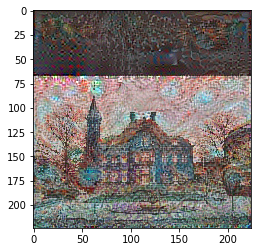

variable(1.850193e+09)
381
cost
variable(1.850193e+09)
iteration: 382 / 1000, loss: 1850193024.0000
variable(1.846891e+09)
382
cost
variable(1.846891e+09)
iteration: 383 / 1000, loss: 1846891008.0000
variable(1.8436215e+09)
383
cost
variable(1.8436215e+09)
iteration: 384 / 1000, loss: 1843621504.0000
variable(1.8402912e+09)
384
cost
variable(1.8402912e+09)
iteration: 385 / 1000, loss: 1840291200.0000
variable(1.8369535e+09)
385
cost
variable(1.8369535e+09)
iteration: 386 / 1000, loss: 1836953472.0000
variable(1.8336966e+09)
386
cost
variable(1.8336966e+09)
iteration: 387 / 1000, loss: 1833696640.0000
variable(1.8304216e+09)
387
cost
variable(1.8304216e+09)
iteration: 388 / 1000, loss: 1830421632.0000
variable(1.8271365e+09)
388
cost
variable(1.8271365e+09)
iteration: 389 / 1000, loss: 1827136512.0000
variable(1.8239373e+09)
389
cost
variable(1.8239373e+09)
iteration: 390 / 1000, loss: 1823937280.0000
variable(1.8207616e+09)
390
cost
variable(1.8207616e+09)
iteration: 391 / 1000, loss: 

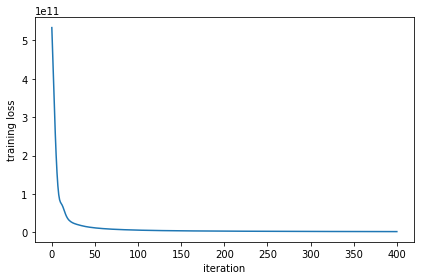

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


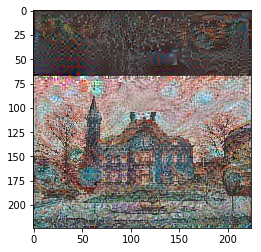

variable(1.7862003e+09)
401
cost
variable(1.7862003e+09)
iteration: 402 / 1000, loss: 1786200320.0000
variable(1.7831324e+09)
402
cost
variable(1.7831324e+09)
iteration: 403 / 1000, loss: 1783132416.0000
variable(1.7801102e+09)
403
cost
variable(1.7801102e+09)
iteration: 404 / 1000, loss: 1780110208.0000
variable(1.7771144e+09)
404
cost
variable(1.7771144e+09)
iteration: 405 / 1000, loss: 1777114368.0000
variable(1.7741053e+09)
405
cost
variable(1.7741053e+09)
iteration: 406 / 1000, loss: 1774105344.0000
variable(1.77113e+09)
406
cost
variable(1.77113e+09)
iteration: 407 / 1000, loss: 1771129984.0000
variable(1.7681527e+09)
407
cost
variable(1.7681527e+09)
iteration: 408 / 1000, loss: 1768152704.0000
variable(1.7652106e+09)
408
cost
variable(1.7652106e+09)
iteration: 409 / 1000, loss: 1765210624.0000
variable(1.7622431e+09)
409
cost
variable(1.7622431e+09)
iteration: 410 / 1000, loss: 1762243072.0000
variable(1.75928e+09)
410
cost
variable(1.75928e+09)
iteration: 411 / 1000, loss: 1759

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.7303007e+09)
iteration: 421 / 1000, loss: 1730300672.0000


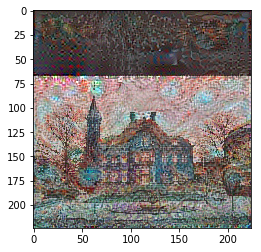

variable(1.7274025e+09)
421
cost
variable(1.7274025e+09)
iteration: 422 / 1000, loss: 1727402496.0000
variable(1.724552e+09)
422
cost
variable(1.724552e+09)
iteration: 423 / 1000, loss: 1724551936.0000
variable(1.7216723e+09)
423
cost
variable(1.7216723e+09)
iteration: 424 / 1000, loss: 1721672320.0000
variable(1.7187677e+09)
424
cost
variable(1.7187677e+09)
iteration: 425 / 1000, loss: 1718767744.0000
variable(1.7159462e+09)
425
cost
variable(1.7159462e+09)
iteration: 426 / 1000, loss: 1715946240.0000
variable(1.7131169e+09)
426
cost
variable(1.7131169e+09)
iteration: 427 / 1000, loss: 1713116928.0000
variable(1.7102528e+09)
427
cost
variable(1.7102528e+09)
iteration: 428 / 1000, loss: 1710252800.0000
variable(1.7074451e+09)
428
cost
variable(1.7074451e+09)
iteration: 429 / 1000, loss: 1707445120.0000
variable(1.7045162e+09)
429
cost
variable(1.7045162e+09)
iteration: 430 / 1000, loss: 1704516224.0000
variable(1.7016934e+09)
430
cost
variable(1.7016934e+09)
iteration: 431 / 1000, loss

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.6732037e+09)
iteration: 441 / 1000, loss: 1673203712.0000


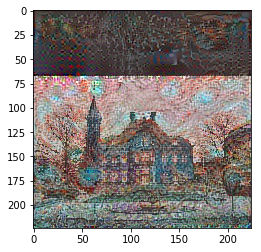

variable(1.670417e+09)
441
cost
variable(1.670417e+09)
iteration: 442 / 1000, loss: 1670417024.0000
variable(1.6676247e+09)
442
cost
variable(1.6676247e+09)
iteration: 443 / 1000, loss: 1667624704.0000
variable(1.6649032e+09)
443
cost
variable(1.6649032e+09)
iteration: 444 / 1000, loss: 1664903168.0000
variable(1.6620897e+09)
444
cost
variable(1.6620897e+09)
iteration: 445 / 1000, loss: 1662089728.0000
variable(1.6594156e+09)
445
cost
variable(1.6594156e+09)
iteration: 446 / 1000, loss: 1659415552.0000
variable(1.656665e+09)
446
cost
variable(1.656665e+09)
iteration: 447 / 1000, loss: 1656664960.0000
variable(1.6539557e+09)
447
cost
variable(1.6539557e+09)
iteration: 448 / 1000, loss: 1653955712.0000
variable(1.6512118e+09)
448
cost
variable(1.6512118e+09)
iteration: 449 / 1000, loss: 1651211776.0000
variable(1.6485603e+09)
449
cost
variable(1.6485603e+09)
iteration: 450 / 1000, loss: 1648560256.0000
variable(1.6458685e+09)
450
cost
variable(1.6458685e+09)
iteration: 451 / 1000, loss: 

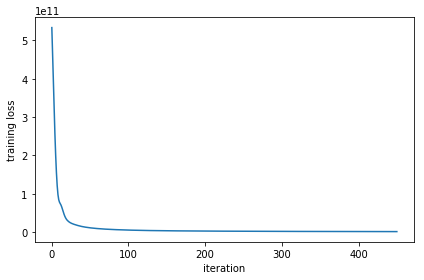

variable(1.643201e+09)
451
cost
variable(1.643201e+09)
iteration: 452 / 1000, loss: 1643201024.0000
variable(1.640554e+09)
452
cost
variable(1.640554e+09)
iteration: 453 / 1000, loss: 1640553984.0000
variable(1.6378441e+09)
453
cost
variable(1.6378441e+09)
iteration: 454 / 1000, loss: 1637844096.0000
variable(1.6352092e+09)
454
cost
variable(1.6352092e+09)
iteration: 455 / 1000, loss: 1635209216.0000
variable(1.6325573e+09)
455
cost
variable(1.6325573e+09)
iteration: 456 / 1000, loss: 1632557312.0000
variable(1.6298857e+09)
456
cost
variable(1.6298857e+09)
iteration: 457 / 1000, loss: 1629885696.0000
variable(1.6272778e+09)
457
cost
variable(1.6272778e+09)
iteration: 458 / 1000, loss: 1627277824.0000
variable(1.624703e+09)
458
cost
variable(1.624703e+09)
iteration: 459 / 1000, loss: 1624702976.0000
variable(1.6221303e+09)
459
cost
variable(1.6221303e+09)
iteration: 460 / 1000, loss: 1622130304.0000
variable(1.6194362e+09)
460
cost


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.6194362e+09)
iteration: 461 / 1000, loss: 1619436160.0000


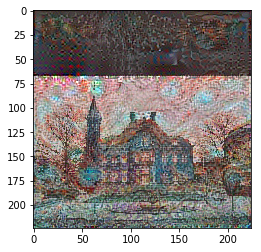

variable(1.6168943e+09)
461
cost
variable(1.6168943e+09)
iteration: 462 / 1000, loss: 1616894336.0000
variable(1.614238e+09)
462
cost
variable(1.614238e+09)
iteration: 463 / 1000, loss: 1614237952.0000
variable(1.6117248e+09)
463
cost
variable(1.6117248e+09)
iteration: 464 / 1000, loss: 1611724800.0000
variable(1.6091931e+09)
464
cost
variable(1.6091931e+09)
iteration: 465 / 1000, loss: 1609193088.0000
variable(1.606571e+09)
465
cost
variable(1.606571e+09)
iteration: 466 / 1000, loss: 1606571008.0000
variable(1.6040329e+09)
466
cost
variable(1.6040329e+09)
iteration: 467 / 1000, loss: 1604032896.0000
variable(1.6014915e+09)
467
cost
variable(1.6014915e+09)
iteration: 468 / 1000, loss: 1601491456.0000
variable(1.5990164e+09)
468
cost
variable(1.5990164e+09)
iteration: 469 / 1000, loss: 1599016448.0000
variable(1.5965071e+09)
469
cost
variable(1.5965071e+09)
iteration: 470 / 1000, loss: 1596507136.0000
variable(1.5939845e+09)
470
cost
variable(1.5939845e+09)
iteration: 471 / 1000, loss: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.5694441e+09)
iteration: 481 / 1000, loss: 1569444096.0000


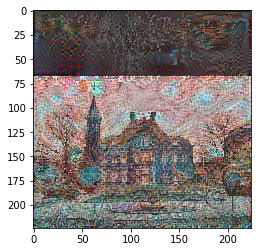

variable(1.5670419e+09)
481
cost
variable(1.5670419e+09)
iteration: 482 / 1000, loss: 1567041920.0000
variable(1.5646377e+09)
482
cost
variable(1.5646377e+09)
iteration: 483 / 1000, loss: 1564637696.0000
variable(1.5622184e+09)
483
cost
variable(1.5622184e+09)
iteration: 484 / 1000, loss: 1562218368.0000
variable(1.5598696e+09)
484
cost
variable(1.5598696e+09)
iteration: 485 / 1000, loss: 1559869568.0000
variable(1.5574111e+09)
485
cost
variable(1.5574111e+09)
iteration: 486 / 1000, loss: 1557411072.0000
variable(1.5550665e+09)
486
cost
variable(1.5550665e+09)
iteration: 487 / 1000, loss: 1555066496.0000
variable(1.552615e+09)
487
cost
variable(1.552615e+09)
iteration: 488 / 1000, loss: 1552615040.0000
variable(1.5501862e+09)
488
cost
variable(1.5501862e+09)
iteration: 489 / 1000, loss: 1550186240.0000
variable(1.5477601e+09)
489
cost
variable(1.5477601e+09)
iteration: 490 / 1000, loss: 1547760128.0000
variable(1.5453818e+09)
490
cost
variable(1.5453818e+09)
iteration: 491 / 1000, loss

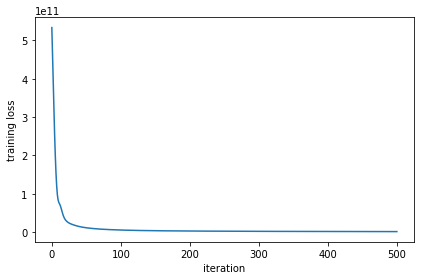

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


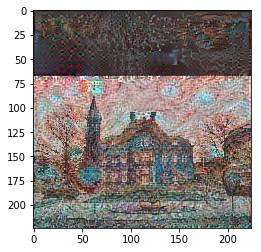

variable(1.5200037e+09)
501
cost
variable(1.5200037e+09)
iteration: 502 / 1000, loss: 1520003712.0000
variable(1.5177928e+09)
502
cost
variable(1.5177928e+09)
iteration: 503 / 1000, loss: 1517792768.0000
variable(1.5154367e+09)
503
cost
variable(1.5154367e+09)
iteration: 504 / 1000, loss: 1515436672.0000
variable(1.5132282e+09)
504
cost
variable(1.5132282e+09)
iteration: 505 / 1000, loss: 1513228160.0000
variable(1.5109467e+09)
505
cost
variable(1.5109467e+09)
iteration: 506 / 1000, loss: 1510946688.0000
variable(1.5088138e+09)
506
cost
variable(1.5088138e+09)
iteration: 507 / 1000, loss: 1508813824.0000
variable(1.5064877e+09)
507
cost
variable(1.5064877e+09)
iteration: 508 / 1000, loss: 1506487680.0000
variable(1.5043016e+09)
508
cost
variable(1.5043016e+09)
iteration: 509 / 1000, loss: 1504301568.0000
variable(1.5020035e+09)
509
cost
variable(1.5020035e+09)
iteration: 510 / 1000, loss: 1502003456.0000
variable(1.4997976e+09)
510
cost
variable(1.4997976e+09)
iteration: 511 / 1000, lo

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.4779548e+09)
iteration: 521 / 1000, loss: 1477954816.0000


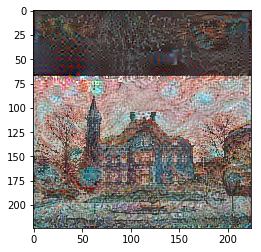

variable(1.4757693e+09)
521
cost
variable(1.4757693e+09)
iteration: 522 / 1000, loss: 1475769344.0000
variable(1.4736407e+09)
522
cost
variable(1.4736407e+09)
iteration: 523 / 1000, loss: 1473640704.0000
variable(1.471516e+09)
523
cost
variable(1.471516e+09)
iteration: 524 / 1000, loss: 1471516032.0000
variable(1.4694518e+09)
524
cost
variable(1.4694518e+09)
iteration: 525 / 1000, loss: 1469451776.0000
variable(1.4672288e+09)
525
cost
variable(1.4672288e+09)
iteration: 526 / 1000, loss: 1467228800.0000
variable(1.4651538e+09)
526
cost
variable(1.4651538e+09)
iteration: 527 / 1000, loss: 1465153792.0000
variable(1.4629832e+09)
527
cost
variable(1.4629832e+09)
iteration: 528 / 1000, loss: 1462983168.0000
variable(1.4608824e+09)
528
cost
variable(1.4608824e+09)
iteration: 529 / 1000, loss: 1460882432.0000
variable(1.458779e+09)
529
cost
variable(1.458779e+09)
iteration: 530 / 1000, loss: 1458779008.0000
variable(1.4566454e+09)
530
cost
variable(1.4566454e+09)
iteration: 531 / 1000, loss: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.4356864e+09)
iteration: 541 / 1000, loss: 1435686400.0000


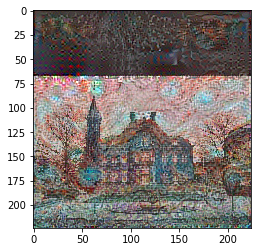

variable(1.4335916e+09)
541
cost
variable(1.4335916e+09)
iteration: 542 / 1000, loss: 1433591552.0000
variable(1.4314758e+09)
542
cost
variable(1.4314758e+09)
iteration: 543 / 1000, loss: 1431475840.0000
variable(1.429396e+09)
543
cost
variable(1.429396e+09)
iteration: 544 / 1000, loss: 1429395968.0000
variable(1.427248e+09)
544
cost
variable(1.427248e+09)
iteration: 545 / 1000, loss: 1427248000.0000
variable(1.4251164e+09)
545
cost
variable(1.4251164e+09)
iteration: 546 / 1000, loss: 1425116416.0000
variable(1.4230186e+09)
546
cost
variable(1.4230186e+09)
iteration: 547 / 1000, loss: 1423018624.0000
variable(1.4209084e+09)
547
cost
variable(1.4209084e+09)
iteration: 548 / 1000, loss: 1420908416.0000
variable(1.4188422e+09)
548
cost
variable(1.4188422e+09)
iteration: 549 / 1000, loss: 1418842240.0000
variable(1.4167117e+09)
549
cost
variable(1.4167117e+09)
iteration: 550 / 1000, loss: 1416711680.0000
variable(1.4145859e+09)
550
cost
variable(1.4145859e+09)
iteration: 551 / 1000, loss: 

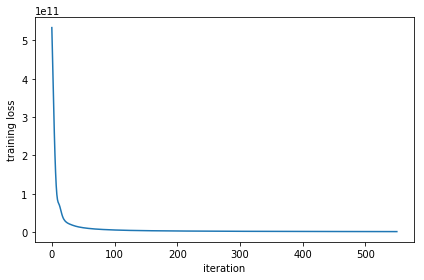

variable(1.41253e+09)
551
cost
variable(1.41253e+09)
iteration: 552 / 1000, loss: 1412530048.0000
variable(1.4104287e+09)
552
cost
variable(1.4104287e+09)
iteration: 553 / 1000, loss: 1410428672.0000
variable(1.4084128e+09)
553
cost
variable(1.4084128e+09)
iteration: 554 / 1000, loss: 1408412800.0000
variable(1.4063109e+09)
554
cost
variable(1.4063109e+09)
iteration: 555 / 1000, loss: 1406310912.0000
variable(1.4043043e+09)
555
cost
variable(1.4043043e+09)
iteration: 556 / 1000, loss: 1404304256.0000
variable(1.4022706e+09)
556
cost
variable(1.4022706e+09)
iteration: 557 / 1000, loss: 1402270592.0000
variable(1.4001603e+09)
557
cost
variable(1.4001603e+09)
iteration: 558 / 1000, loss: 1400160256.0000
variable(1.3980603e+09)
558
cost
variable(1.3980603e+09)
iteration: 559 / 1000, loss: 1398060288.0000
variable(1.3959319e+09)
559
cost
variable(1.3959319e+09)
iteration: 560 / 1000, loss: 1395931904.0000
variable(1.3937638e+09)
560
cost


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.3937638e+09)
iteration: 561 / 1000, loss: 1393763840.0000


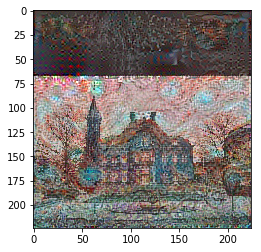

variable(1.3916671e+09)
561
cost
variable(1.3916671e+09)
iteration: 562 / 1000, loss: 1391667072.0000
variable(1.3895192e+09)
562
cost
variable(1.3895192e+09)
iteration: 563 / 1000, loss: 1389519232.0000
variable(1.3873315e+09)
563
cost
variable(1.3873315e+09)
iteration: 564 / 1000, loss: 1387331456.0000
variable(1.3852244e+09)
564
cost
variable(1.3852244e+09)
iteration: 565 / 1000, loss: 1385224448.0000
variable(1.3831023e+09)
565
cost
variable(1.3831023e+09)
iteration: 566 / 1000, loss: 1383102336.0000
variable(1.3809926e+09)
566
cost
variable(1.3809926e+09)
iteration: 567 / 1000, loss: 1380992640.0000
variable(1.3788745e+09)
567
cost
variable(1.3788745e+09)
iteration: 568 / 1000, loss: 1378874496.0000
variable(1.3767255e+09)
568
cost
variable(1.3767255e+09)
iteration: 569 / 1000, loss: 1376725504.0000
variable(1.3745239e+09)
569
cost
variable(1.3745239e+09)
iteration: 570 / 1000, loss: 1374523904.0000
variable(1.3724141e+09)
570
cost
variable(1.3724141e+09)
iteration: 571 / 1000, lo

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.3517565e+09)
iteration: 581 / 1000, loss: 1351756544.0000


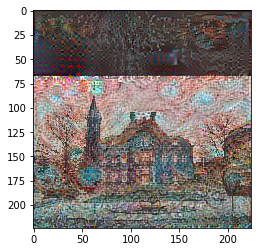

variable(1.3498296e+09)
581
cost
variable(1.3498296e+09)
iteration: 582 / 1000, loss: 1349829632.0000
variable(1.3478894e+09)
582
cost
variable(1.3478894e+09)
iteration: 583 / 1000, loss: 1347889408.0000
variable(1.3458262e+09)
583
cost
variable(1.3458262e+09)
iteration: 584 / 1000, loss: 1345826176.0000
variable(1.3439223e+09)
584
cost
variable(1.3439223e+09)
iteration: 585 / 1000, loss: 1343922304.0000
variable(1.341981e+09)
585
cost
variable(1.341981e+09)
iteration: 586 / 1000, loss: 1341981056.0000
variable(1.3400244e+09)
586
cost
variable(1.3400244e+09)
iteration: 587 / 1000, loss: 1340024448.0000
variable(1.3381615e+09)
587
cost
variable(1.3381615e+09)
iteration: 588 / 1000, loss: 1338161536.0000
variable(1.3362284e+09)
588
cost
variable(1.3362284e+09)
iteration: 589 / 1000, loss: 1336228352.0000
variable(1.3343186e+09)
589
cost
variable(1.3343186e+09)
iteration: 590 / 1000, loss: 1334318592.0000
variable(1.3324344e+09)
590
cost
variable(1.3324344e+09)
iteration: 591 / 1000, loss

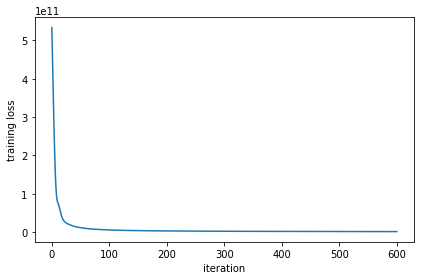

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


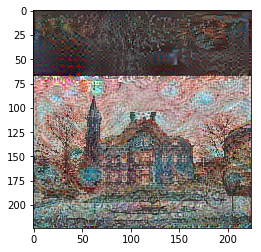

variable(1.3121595e+09)
601
cost
variable(1.3121595e+09)
iteration: 602 / 1000, loss: 1312159488.0000
variable(1.3103153e+09)
602
cost
variable(1.3103153e+09)
iteration: 603 / 1000, loss: 1310315264.0000
variable(1.3084599e+09)
603
cost
variable(1.3084599e+09)
iteration: 604 / 1000, loss: 1308459904.0000
variable(1.3067492e+09)
604
cost
variable(1.3067492e+09)
iteration: 605 / 1000, loss: 1306749184.0000
variable(1.3048806e+09)
605
cost
variable(1.3048806e+09)
iteration: 606 / 1000, loss: 1304880640.0000
variable(1.3032502e+09)
606
cost
variable(1.3032502e+09)
iteration: 607 / 1000, loss: 1303250176.0000
variable(1.3012266e+09)
607
cost
variable(1.3012266e+09)
iteration: 608 / 1000, loss: 1301226624.0000
variable(1.2996338e+09)
608
cost
variable(1.2996338e+09)
iteration: 609 / 1000, loss: 1299633792.0000
variable(1.2977258e+09)
609
cost
variable(1.2977258e+09)
iteration: 610 / 1000, loss: 1297725824.0000
variable(1.296082e+09)
610
cost
variable(1.296082e+09)
iteration: 611 / 1000, loss

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.2782277e+09)
iteration: 621 / 1000, loss: 1278227712.0000


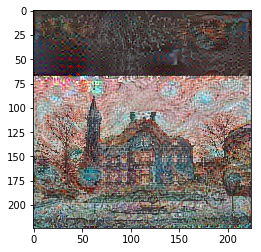

variable(1.276603e+09)
621
cost
variable(1.276603e+09)
iteration: 622 / 1000, loss: 1276603008.0000
variable(1.2748653e+09)
622
cost
variable(1.2748653e+09)
iteration: 623 / 1000, loss: 1274865280.0000
variable(1.273139e+09)
623
cost
variable(1.273139e+09)
iteration: 624 / 1000, loss: 1273138944.0000
variable(1.271397e+09)
624
cost
variable(1.271397e+09)
iteration: 625 / 1000, loss: 1271396992.0000
variable(1.2696915e+09)
625
cost
variable(1.2696915e+09)
iteration: 626 / 1000, loss: 1269691520.0000
variable(1.2680333e+09)
626
cost
variable(1.2680333e+09)
iteration: 627 / 1000, loss: 1268033280.0000
variable(1.2663167e+09)
627
cost
variable(1.2663167e+09)
iteration: 628 / 1000, loss: 1266316672.0000
variable(1.2647104e+09)
628
cost
variable(1.2647104e+09)
iteration: 629 / 1000, loss: 1264710400.0000
variable(1.2629559e+09)
629
cost
variable(1.2629559e+09)
iteration: 630 / 1000, loss: 1262955904.0000
variable(1.2613915e+09)
630
cost
variable(1.2613915e+09)
iteration: 631 / 1000, loss: 12

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.2450744e+09)
iteration: 641 / 1000, loss: 1245074432.0000


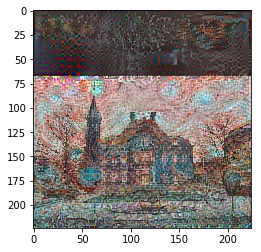

variable(1.2435506e+09)
641
cost
variable(1.2435506e+09)
iteration: 642 / 1000, loss: 1243550592.0000
variable(1.2418404e+09)
642
cost
variable(1.2418404e+09)
iteration: 643 / 1000, loss: 1241840384.0000
variable(1.2402835e+09)
643
cost
variable(1.2402835e+09)
iteration: 644 / 1000, loss: 1240283520.0000
variable(1.2387259e+09)
644
cost
variable(1.2387259e+09)
iteration: 645 / 1000, loss: 1238725888.0000
variable(1.2370223e+09)
645
cost
variable(1.2370223e+09)
iteration: 646 / 1000, loss: 1237022336.0000
variable(1.235519e+09)
646
cost
variable(1.235519e+09)
iteration: 647 / 1000, loss: 1235518976.0000
variable(1.2338958e+09)
647
cost
variable(1.2338958e+09)
iteration: 648 / 1000, loss: 1233895808.0000
variable(1.2324097e+09)
648
cost
variable(1.2324097e+09)
iteration: 649 / 1000, loss: 1232409728.0000
variable(1.2308152e+09)
649
cost
variable(1.2308152e+09)
iteration: 650 / 1000, loss: 1230815232.0000
variable(1.229178e+09)
650
cost
variable(1.229178e+09)
iteration: 651 / 1000, loss: 

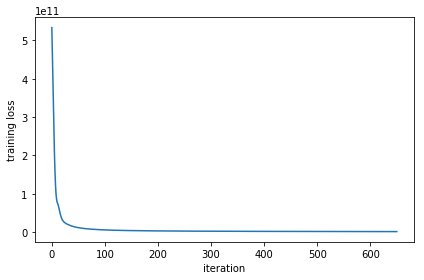

variable(1.2276662e+09)
651
cost
variable(1.2276662e+09)
iteration: 652 / 1000, loss: 1227666176.0000
variable(1.2261064e+09)
652
cost
variable(1.2261064e+09)
iteration: 653 / 1000, loss: 1226106368.0000
variable(1.224569e+09)
653
cost
variable(1.224569e+09)
iteration: 654 / 1000, loss: 1224568960.0000
variable(1.2230175e+09)
654
cost
variable(1.2230175e+09)
iteration: 655 / 1000, loss: 1223017472.0000
variable(1.2214588e+09)
655
cost
variable(1.2214588e+09)
iteration: 656 / 1000, loss: 1221458816.0000
variable(1.2199412e+09)
656
cost
variable(1.2199412e+09)
iteration: 657 / 1000, loss: 1219941248.0000
variable(1.2184087e+09)
657
cost
variable(1.2184087e+09)
iteration: 658 / 1000, loss: 1218408704.0000
variable(1.2168809e+09)
658
cost
variable(1.2168809e+09)
iteration: 659 / 1000, loss: 1216880896.0000
variable(1.21529e+09)
659
cost
variable(1.21529e+09)
iteration: 660 / 1000, loss: 1215289984.0000
variable(1.2137983e+09)
660
cost


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.2137983e+09)
iteration: 661 / 1000, loss: 1213798272.0000


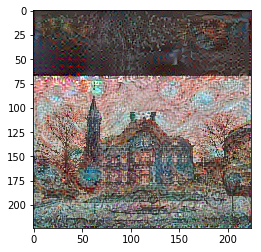

variable(1.2123278e+09)
661
cost
variable(1.2123278e+09)
iteration: 662 / 1000, loss: 1212327808.0000
variable(1.2108513e+09)
662
cost
variable(1.2108513e+09)
iteration: 663 / 1000, loss: 1210851328.0000
variable(1.2093672e+09)
663
cost
variable(1.2093672e+09)
iteration: 664 / 1000, loss: 1209367168.0000
variable(1.2078412e+09)
664
cost
variable(1.2078412e+09)
iteration: 665 / 1000, loss: 1207841152.0000
variable(1.2063983e+09)
665
cost
variable(1.2063983e+09)
iteration: 666 / 1000, loss: 1206398336.0000
variable(1.2049004e+09)
666
cost
variable(1.2049004e+09)
iteration: 667 / 1000, loss: 1204900352.0000
variable(1.2034159e+09)
667
cost
variable(1.2034159e+09)
iteration: 668 / 1000, loss: 1203415936.0000
variable(1.2019604e+09)
668
cost
variable(1.2019604e+09)
iteration: 669 / 1000, loss: 1201960448.0000
variable(1.2005562e+09)
669
cost
variable(1.2005562e+09)
iteration: 670 / 1000, loss: 1200556160.0000
variable(1.1991265e+09)
670
cost
variable(1.1991265e+09)
iteration: 671 / 1000, lo

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.1849818e+09)
iteration: 681 / 1000, loss: 1184981760.0000


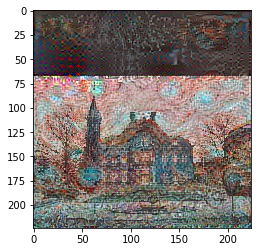

variable(1.1835342e+09)
681
cost
variable(1.1835342e+09)
iteration: 682 / 1000, loss: 1183534208.0000
variable(1.1821498e+09)
682
cost
variable(1.1821498e+09)
iteration: 683 / 1000, loss: 1182149760.0000
variable(1.1807799e+09)
683
cost
variable(1.1807799e+09)
iteration: 684 / 1000, loss: 1180779904.0000
variable(1.1793595e+09)
684
cost
variable(1.1793595e+09)
iteration: 685 / 1000, loss: 1179359488.0000
variable(1.1779695e+09)
685
cost
variable(1.1779695e+09)
iteration: 686 / 1000, loss: 1177969536.0000
variable(1.1766216e+09)
686
cost
variable(1.1766216e+09)
iteration: 687 / 1000, loss: 1176621568.0000
variable(1.1751672e+09)
687
cost
variable(1.1751672e+09)
iteration: 688 / 1000, loss: 1175167232.0000
variable(1.173792e+09)
688
cost
variable(1.173792e+09)
iteration: 689 / 1000, loss: 1173792000.0000
variable(1.1724375e+09)
689
cost
variable(1.1724375e+09)
iteration: 690 / 1000, loss: 1172437504.0000
variable(1.1710098e+09)
690
cost
variable(1.1710098e+09)
iteration: 691 / 1000, loss

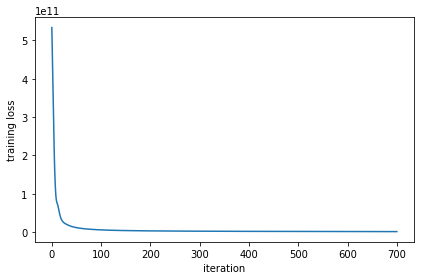

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


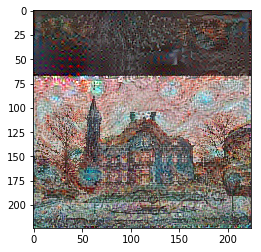

variable(1.1561055e+09)
701
cost
variable(1.1561055e+09)
iteration: 702 / 1000, loss: 1156105472.0000
variable(1.1547324e+09)
702
cost
variable(1.1547324e+09)
iteration: 703 / 1000, loss: 1154732416.0000
variable(1.1534275e+09)
703
cost
variable(1.1534275e+09)
iteration: 704 / 1000, loss: 1153427456.0000
variable(1.1520714e+09)
704
cost
variable(1.1520714e+09)
iteration: 705 / 1000, loss: 1152071424.0000
variable(1.1507099e+09)
705
cost
variable(1.1507099e+09)
iteration: 706 / 1000, loss: 1150709888.0000
variable(1.1494661e+09)
706
cost
variable(1.1494661e+09)
iteration: 707 / 1000, loss: 1149466112.0000
variable(1.1480714e+09)
707
cost
variable(1.1480714e+09)
iteration: 708 / 1000, loss: 1148071424.0000
variable(1.1468027e+09)
708
cost
variable(1.1468027e+09)
iteration: 709 / 1000, loss: 1146802688.0000
variable(1.1454011e+09)
709
cost
variable(1.1454011e+09)
iteration: 710 / 1000, loss: 1145401088.0000
variable(1.1441545e+09)
710
cost
variable(1.1441545e+09)
iteration: 711 / 1000, lo

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.1309286e+09)
iteration: 721 / 1000, loss: 1130928640.0000


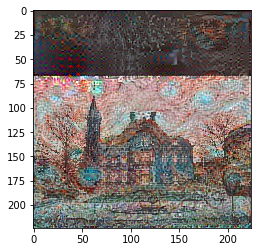

variable(1.1296808e+09)
721
cost
variable(1.1296808e+09)
iteration: 722 / 1000, loss: 1129680768.0000
variable(1.1283018e+09)
722
cost
variable(1.1283018e+09)
iteration: 723 / 1000, loss: 1128301824.0000
variable(1.127042e+09)
723
cost
variable(1.127042e+09)
iteration: 724 / 1000, loss: 1127042048.0000
variable(1.1257354e+09)
724
cost
variable(1.1257354e+09)
iteration: 725 / 1000, loss: 1125735424.0000
variable(1.1244456e+09)
725
cost
variable(1.1244456e+09)
iteration: 726 / 1000, loss: 1124445568.0000
variable(1.1231187e+09)
726
cost
variable(1.1231187e+09)
iteration: 727 / 1000, loss: 1123118720.0000
variable(1.1218268e+09)
727
cost
variable(1.1218268e+09)
iteration: 728 / 1000, loss: 1121826816.0000
variable(1.1205357e+09)
728
cost
variable(1.1205357e+09)
iteration: 729 / 1000, loss: 1120535680.0000
variable(1.1192722e+09)
729
cost
variable(1.1192722e+09)
iteration: 730 / 1000, loss: 1119272192.0000
variable(1.1179852e+09)
730
cost
variable(1.1179852e+09)
iteration: 731 / 1000, loss

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.1054039e+09)
iteration: 741 / 1000, loss: 1105403904.0000


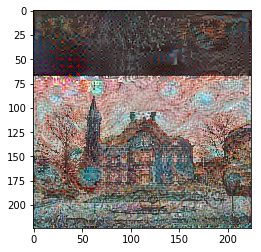

variable(1.1042088e+09)
741
cost
variable(1.1042088e+09)
iteration: 742 / 1000, loss: 1104208768.0000
variable(1.1029583e+09)
742
cost
variable(1.1029583e+09)
iteration: 743 / 1000, loss: 1102958336.0000
variable(1.1017362e+09)
743
cost
variable(1.1017362e+09)
iteration: 744 / 1000, loss: 1101736192.0000
variable(1.1005032e+09)
744
cost
variable(1.1005032e+09)
iteration: 745 / 1000, loss: 1100503168.0000
variable(1.0992959e+09)
745
cost
variable(1.0992959e+09)
iteration: 746 / 1000, loss: 1099295872.0000
variable(1.0980462e+09)
746
cost
variable(1.0980462e+09)
iteration: 747 / 1000, loss: 1098046208.0000
variable(1.0967442e+09)
747
cost
variable(1.0967442e+09)
iteration: 748 / 1000, loss: 1096744192.0000
variable(1.0955689e+09)
748
cost
variable(1.0955689e+09)
iteration: 749 / 1000, loss: 1095568896.0000
variable(1.0943882e+09)
749
cost
variable(1.0943882e+09)
iteration: 750 / 1000, loss: 1094388224.0000
variable(1.0931012e+09)
750
cost
variable(1.0931012e+09)
iteration: 751 / 1000, lo

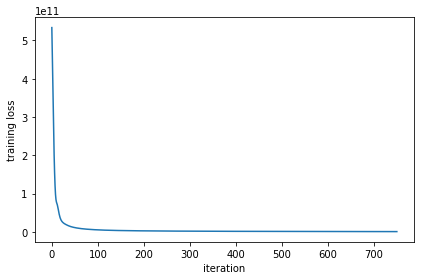

variable(1.0919398e+09)
751
cost
variable(1.0919398e+09)
iteration: 752 / 1000, loss: 1091939840.0000
variable(1.0907498e+09)
752
cost
variable(1.0907498e+09)
iteration: 753 / 1000, loss: 1090749824.0000
variable(1.0895306e+09)
753
cost
variable(1.0895306e+09)
iteration: 754 / 1000, loss: 1089530624.0000
variable(1.0883168e+09)
754
cost
variable(1.0883168e+09)
iteration: 755 / 1000, loss: 1088316800.0000
variable(1.0871025e+09)
755
cost
variable(1.0871025e+09)
iteration: 756 / 1000, loss: 1087102464.0000
variable(1.0859685e+09)
756
cost
variable(1.0859685e+09)
iteration: 757 / 1000, loss: 1085968512.0000
variable(1.084726e+09)
757
cost
variable(1.084726e+09)
iteration: 758 / 1000, loss: 1084726016.0000
variable(1.0835608e+09)
758
cost
variable(1.0835608e+09)
iteration: 759 / 1000, loss: 1083560832.0000
variable(1.0824093e+09)
759
cost
variable(1.0824093e+09)
iteration: 760 / 1000, loss: 1082409344.0000
variable(1.0811729e+09)
760
cost


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.0811729e+09)
iteration: 761 / 1000, loss: 1081172864.0000


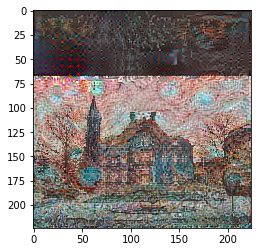

variable(1.080062e+09)
761
cost
variable(1.080062e+09)
iteration: 762 / 1000, loss: 1080061952.0000
variable(1.0787987e+09)
762
cost
variable(1.0787987e+09)
iteration: 763 / 1000, loss: 1078798720.0000
variable(1.0776701e+09)
763
cost
variable(1.0776701e+09)
iteration: 764 / 1000, loss: 1077670144.0000
variable(1.0764608e+09)
764
cost
variable(1.0764608e+09)
iteration: 765 / 1000, loss: 1076460800.0000
variable(1.0752991e+09)
765
cost
variable(1.0752991e+09)
iteration: 766 / 1000, loss: 1075299072.0000
variable(1.0740623e+09)
766
cost
variable(1.0740623e+09)
iteration: 767 / 1000, loss: 1074062336.0000
variable(1.0729007e+09)
767
cost
variable(1.0729007e+09)
iteration: 768 / 1000, loss: 1072900672.0000
variable(1.0716511e+09)
768
cost
variable(1.0716511e+09)
iteration: 769 / 1000, loss: 1071651072.0000
variable(1.070503e+09)
769
cost
variable(1.070503e+09)
iteration: 770 / 1000, loss: 1070502976.0000
variable(1.0693365e+09)
770
cost
variable(1.0693365e+09)
iteration: 771 / 1000, loss: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.05768435e+09)
iteration: 781 / 1000, loss: 1057684352.0000


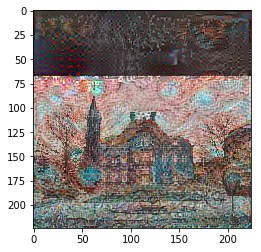

variable(1.05652416e+09)
781
cost
variable(1.05652416e+09)
iteration: 782 / 1000, loss: 1056524160.0000
variable(1.05538566e+09)
782
cost
variable(1.05538566e+09)
iteration: 783 / 1000, loss: 1055385664.0000
variable(1.0542851e+09)
783
cost
variable(1.0542851e+09)
iteration: 784 / 1000, loss: 1054285120.0000
variable(1.05314746e+09)
784
cost
variable(1.05314746e+09)
iteration: 785 / 1000, loss: 1053147456.0000
variable(1.0520375e+09)
785
cost
variable(1.0520375e+09)
iteration: 786 / 1000, loss: 1052037504.0000
variable(1.0509119e+09)
786
cost
variable(1.0509119e+09)
iteration: 787 / 1000, loss: 1050911872.0000
variable(1.04973325e+09)
787
cost
variable(1.04973325e+09)
iteration: 788 / 1000, loss: 1049733248.0000
variable(1.04871104e+09)
788
cost
variable(1.04871104e+09)
iteration: 789 / 1000, loss: 1048711040.0000
variable(1.04749984e+09)
789
cost
variable(1.04749984e+09)
iteration: 790 / 1000, loss: 1047499840.0000
variable(1.04645696e+09)
790
cost
variable(1.04645696e+09)
iteration: 

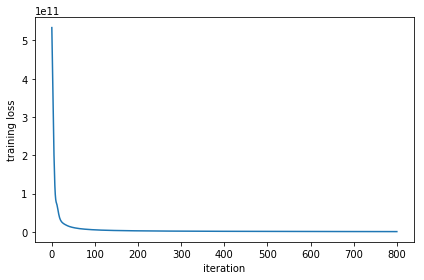

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


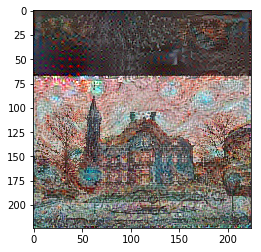

variable(1.03432576e+09)
801
cost
variable(1.03432576e+09)
iteration: 802 / 1000, loss: 1034325760.0000
variable(1.0332114e+09)
802
cost
variable(1.0332114e+09)
iteration: 803 / 1000, loss: 1033211392.0000
variable(1.0321457e+09)
803
cost
variable(1.0321457e+09)
iteration: 804 / 1000, loss: 1032145728.0000
variable(1.03107085e+09)
804
cost
variable(1.03107085e+09)
iteration: 805 / 1000, loss: 1031070848.0000
variable(1.0300142e+09)
805
cost
variable(1.0300142e+09)
iteration: 806 / 1000, loss: 1030014208.0000
variable(1.02885235e+09)
806
cost
variable(1.02885235e+09)
iteration: 807 / 1000, loss: 1028852352.0000
variable(1.02792614e+09)
807
cost
variable(1.02792614e+09)
iteration: 808 / 1000, loss: 1027926144.0000
variable(1.0267511e+09)
808
cost
variable(1.0267511e+09)
iteration: 809 / 1000, loss: 1026751104.0000
variable(1.0257376e+09)
809
cost
variable(1.0257376e+09)
iteration: 810 / 1000, loss: 1025737600.0000
variable(1.0246386e+09)
810
cost
variable(1.0246386e+09)
iteration: 811 / 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(1.0140382e+09)
iteration: 821 / 1000, loss: 1014038208.0000


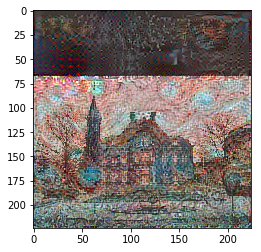

variable(1.0128863e+09)
821
cost
variable(1.0128863e+09)
iteration: 822 / 1000, loss: 1012886272.0000
variable(1.0118887e+09)
822
cost
variable(1.0118887e+09)
iteration: 823 / 1000, loss: 1011888704.0000
variable(1.01071354e+09)
823
cost
variable(1.01071354e+09)
iteration: 824 / 1000, loss: 1010713536.0000
variable(1.0096738e+09)
824
cost
variable(1.0096738e+09)
iteration: 825 / 1000, loss: 1009673792.0000
variable(1.00861914e+09)
825
cost
variable(1.00861914e+09)
iteration: 826 / 1000, loss: 1008619136.0000
variable(1.0075682e+09)
826
cost
variable(1.0075682e+09)
iteration: 827 / 1000, loss: 1007568192.0000
variable(1.0065616e+09)
827
cost
variable(1.0065616e+09)
iteration: 828 / 1000, loss: 1006561600.0000
variable(1.0054591e+09)
828
cost
variable(1.0054591e+09)
iteration: 829 / 1000, loss: 1005459072.0000
variable(1.00442464e+09)
829
cost
variable(1.00442464e+09)
iteration: 830 / 1000, loss: 1004424640.0000
variable(1.00347245e+09)
830
cost
variable(1.00347245e+09)
iteration: 831 / 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(9.928992e+08)
iteration: 841 / 1000, loss: 992899200.0000


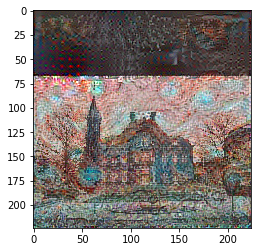

variable(9.919234e+08)
841
cost
variable(9.919234e+08)
iteration: 842 / 1000, loss: 991923392.0000
variable(9.908072e+08)
842
cost
variable(9.908072e+08)
iteration: 843 / 1000, loss: 990807168.0000
variable(9.8970106e+08)
843
cost
variable(9.8970106e+08)
iteration: 844 / 1000, loss: 989701056.0000
variable(9.887008e+08)
844
cost
variable(9.887008e+08)
iteration: 845 / 1000, loss: 988700800.0000
variable(9.876149e+08)
845
cost
variable(9.876149e+08)
iteration: 846 / 1000, loss: 987614912.0000
variable(9.8653184e+08)
846
cost
variable(9.8653184e+08)
iteration: 847 / 1000, loss: 986531840.0000
variable(9.855065e+08)
847
cost
variable(9.855065e+08)
iteration: 848 / 1000, loss: 985506496.0000
variable(9.8449485e+08)
848
cost
variable(9.8449485e+08)
iteration: 849 / 1000, loss: 984494848.0000
variable(9.833695e+08)
849
cost
variable(9.833695e+08)
iteration: 850 / 1000, loss: 983369472.0000
variable(9.824587e+08)
850
cost
variable(9.824587e+08)
iteration: 851 / 1000, loss: 982458688.0000


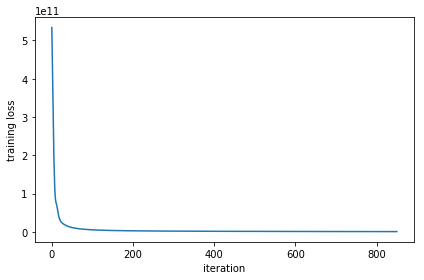

variable(9.813282e+08)
851
cost
variable(9.813282e+08)
iteration: 852 / 1000, loss: 981328192.0000
variable(9.803086e+08)
852
cost
variable(9.803086e+08)
iteration: 853 / 1000, loss: 980308608.0000
variable(9.792852e+08)
853
cost
variable(9.792852e+08)
iteration: 854 / 1000, loss: 979285184.0000
variable(9.782719e+08)
854
cost
variable(9.782719e+08)
iteration: 855 / 1000, loss: 978271872.0000
variable(9.7725594e+08)
855
cost
variable(9.7725594e+08)
iteration: 856 / 1000, loss: 977255936.0000
variable(9.7614144e+08)
856
cost
variable(9.7614144e+08)
iteration: 857 / 1000, loss: 976141440.0000
variable(9.75165e+08)
857
cost
variable(9.75165e+08)
iteration: 858 / 1000, loss: 975164992.0000
variable(9.741849e+08)
858
cost
variable(9.741849e+08)
iteration: 859 / 1000, loss: 974184896.0000
variable(9.730708e+08)
859
cost
variable(9.730708e+08)
iteration: 860 / 1000, loss: 973070784.0000
variable(9.720461e+08)
860
cost


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(9.720461e+08)
iteration: 861 / 1000, loss: 972046080.0000


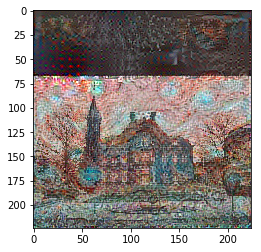

variable(9.711012e+08)
861
cost
variable(9.711012e+08)
iteration: 862 / 1000, loss: 971101184.0000
variable(9.700673e+08)
862
cost
variable(9.700673e+08)
iteration: 863 / 1000, loss: 970067328.0000
variable(9.690312e+08)
863
cost
variable(9.690312e+08)
iteration: 864 / 1000, loss: 969031168.0000
variable(9.679823e+08)
864
cost
variable(9.679823e+08)
iteration: 865 / 1000, loss: 967982272.0000
variable(9.668778e+08)
865
cost
variable(9.668778e+08)
iteration: 866 / 1000, loss: 966877824.0000
variable(9.660257e+08)
866
cost
variable(9.660257e+08)
iteration: 867 / 1000, loss: 966025728.0000
variable(9.6489363e+08)
867
cost
variable(9.6489363e+08)
iteration: 868 / 1000, loss: 964893632.0000
variable(9.638826e+08)
868
cost
variable(9.638826e+08)
iteration: 869 / 1000, loss: 963882624.0000
variable(9.628632e+08)
869
cost
variable(9.628632e+08)
iteration: 870 / 1000, loss: 962863232.0000
variable(9.6188064e+08)
870
cost
variable(9.6188064e+08)
iteration: 871 / 1000, loss: 961880640.0000
variab

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(9.51722e+08)
iteration: 881 / 1000, loss: 951721984.0000


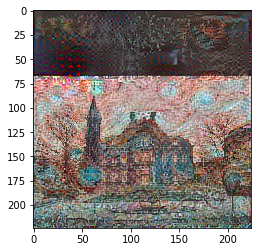

variable(9.5077203e+08)
881
cost
variable(9.5077203e+08)
iteration: 882 / 1000, loss: 950772032.0000
variable(9.497372e+08)
882
cost
variable(9.497372e+08)
iteration: 883 / 1000, loss: 949737216.0000
variable(9.487552e+08)
883
cost
variable(9.487552e+08)
iteration: 884 / 1000, loss: 948755200.0000
variable(9.477012e+08)
884
cost
variable(9.477012e+08)
iteration: 885 / 1000, loss: 947701184.0000
variable(9.466557e+08)
885
cost
variable(9.466557e+08)
iteration: 886 / 1000, loss: 946655680.0000
variable(9.4570765e+08)
886
cost
variable(9.4570765e+08)
iteration: 887 / 1000, loss: 945707648.0000
variable(9.446592e+08)
887
cost
variable(9.446592e+08)
iteration: 888 / 1000, loss: 944659200.0000
variable(9.4360256e+08)
888
cost
variable(9.4360256e+08)
iteration: 889 / 1000, loss: 943602560.0000
variable(9.4260794e+08)
889
cost
variable(9.4260794e+08)
iteration: 890 / 1000, loss: 942607936.0000
variable(9.416492e+08)
890
cost
variable(9.416492e+08)
iteration: 891 / 1000, loss: 941649216.0000
va

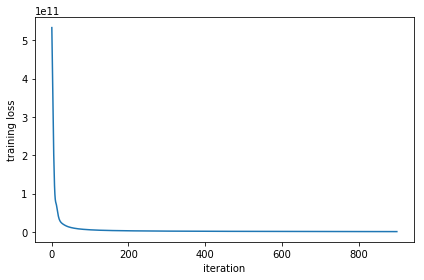

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


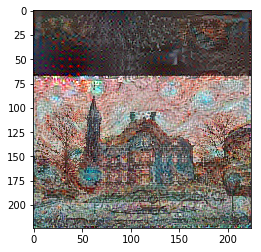

variable(9.304949e+08)
901
cost
variable(9.304949e+08)
iteration: 902 / 1000, loss: 930494912.0000
variable(9.295113e+08)
902
cost
variable(9.295113e+08)
iteration: 903 / 1000, loss: 929511296.0000
variable(9.284633e+08)
903
cost
variable(9.284633e+08)
iteration: 904 / 1000, loss: 928463296.0000
variable(9.274918e+08)
904
cost
variable(9.274918e+08)
iteration: 905 / 1000, loss: 927491776.0000
variable(9.264555e+08)
905
cost
variable(9.264555e+08)
iteration: 906 / 1000, loss: 926455488.0000
variable(9.254448e+08)
906
cost
variable(9.254448e+08)
iteration: 907 / 1000, loss: 925444800.0000
variable(9.244338e+08)
907
cost
variable(9.244338e+08)
iteration: 908 / 1000, loss: 924433792.0000
variable(9.2339776e+08)
908
cost
variable(9.2339776e+08)
iteration: 909 / 1000, loss: 923397760.0000
variable(9.224901e+08)
909
cost
variable(9.224901e+08)
iteration: 910 / 1000, loss: 922490112.0000
variable(9.21438e+08)
910
cost
variable(9.21438e+08)
iteration: 911 / 1000, loss: 921438016.0000
variable(9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(9.116435e+08)
iteration: 921 / 1000, loss: 911643520.0000


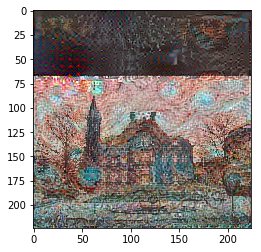

variable(9.10655e+08)
921
cost
variable(9.10655e+08)
iteration: 922 / 1000, loss: 910654976.0000
variable(9.096476e+08)
922
cost
variable(9.096476e+08)
iteration: 923 / 1000, loss: 909647616.0000
variable(9.0876064e+08)
923
cost
variable(9.0876064e+08)
iteration: 924 / 1000, loss: 908760640.0000
variable(9.0781446e+08)
924
cost
variable(9.0781446e+08)
iteration: 925 / 1000, loss: 907814464.0000
variable(9.0694886e+08)
925
cost
variable(9.0694886e+08)
iteration: 926 / 1000, loss: 906948864.0000
variable(9.059173e+08)
926
cost
variable(9.059173e+08)
iteration: 927 / 1000, loss: 905917312.0000
variable(9.0505466e+08)
927
cost
variable(9.0505466e+08)
iteration: 928 / 1000, loss: 905054656.0000
variable(9.041466e+08)
928
cost
variable(9.041466e+08)
iteration: 929 / 1000, loss: 904146624.0000
variable(9.031778e+08)
929
cost
variable(9.031778e+08)
iteration: 930 / 1000, loss: 903177792.0000
variable(9.022353e+08)
930
cost
variable(9.022353e+08)
iteration: 931 / 1000, loss: 902235328.0000
vari

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(8.931423e+08)
iteration: 941 / 1000, loss: 893142272.0000


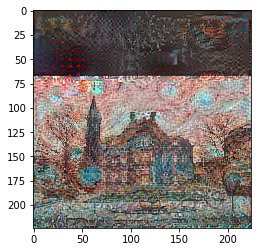

variable(8.922578e+08)
941
cost
variable(8.922578e+08)
iteration: 942 / 1000, loss: 892257792.0000
variable(8.913739e+08)
942
cost
variable(8.913739e+08)
iteration: 943 / 1000, loss: 891373888.0000
variable(8.905004e+08)
943
cost
variable(8.905004e+08)
iteration: 944 / 1000, loss: 890500416.0000
variable(8.8963757e+08)
944
cost
variable(8.8963757e+08)
iteration: 945 / 1000, loss: 889637568.0000
variable(8.887107e+08)
945
cost
variable(8.887107e+08)
iteration: 946 / 1000, loss: 888710720.0000
variable(8.878249e+08)
946
cost
variable(8.878249e+08)
iteration: 947 / 1000, loss: 887824896.0000
variable(8.8695674e+08)
947
cost
variable(8.8695674e+08)
iteration: 948 / 1000, loss: 886956736.0000
variable(8.860099e+08)
948
cost
variable(8.860099e+08)
iteration: 949 / 1000, loss: 886009920.0000
variable(8.851305e+08)
949
cost
variable(8.851305e+08)
iteration: 950 / 1000, loss: 885130496.0000
variable(8.842972e+08)
950
cost
variable(8.842972e+08)
iteration: 951 / 1000, loss: 884297216.0000


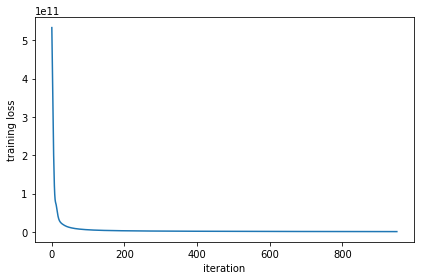

variable(8.833862e+08)
951
cost
variable(8.833862e+08)
iteration: 952 / 1000, loss: 883386176.0000
variable(8.825342e+08)
952
cost
variable(8.825342e+08)
iteration: 953 / 1000, loss: 882534208.0000
variable(8.8165325e+08)
953
cost
variable(8.8165325e+08)
iteration: 954 / 1000, loss: 881653248.0000
variable(8.807217e+08)
954
cost
variable(8.807217e+08)
iteration: 955 / 1000, loss: 880721728.0000
variable(8.798734e+08)
955
cost
variable(8.798734e+08)
iteration: 956 / 1000, loss: 879873408.0000
variable(8.789948e+08)
956
cost
variable(8.789948e+08)
iteration: 957 / 1000, loss: 878994816.0000
variable(8.7810285e+08)
957
cost
variable(8.7810285e+08)
iteration: 958 / 1000, loss: 878102848.0000
variable(8.772074e+08)
958
cost
variable(8.772074e+08)
iteration: 959 / 1000, loss: 877207424.0000
variable(8.76393e+08)
959
cost
variable(8.76393e+08)
iteration: 960 / 1000, loss: 876393024.0000
variable(8.754362e+08)
960
cost


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(8.754362e+08)
iteration: 961 / 1000, loss: 875436224.0000


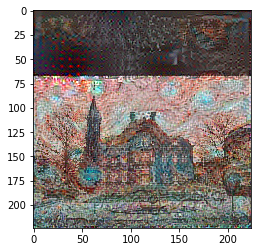

variable(8.746098e+08)
961
cost
variable(8.746098e+08)
iteration: 962 / 1000, loss: 874609792.0000
variable(8.7372384e+08)
962
cost
variable(8.7372384e+08)
iteration: 963 / 1000, loss: 873723840.0000
variable(8.7280294e+08)
963
cost
variable(8.7280294e+08)
iteration: 964 / 1000, loss: 872802944.0000
variable(8.719306e+08)
964
cost
variable(8.719306e+08)
iteration: 965 / 1000, loss: 871930624.0000
variable(8.7098394e+08)
965
cost
variable(8.7098394e+08)
iteration: 966 / 1000, loss: 870983936.0000
variable(8.701906e+08)
966
cost
variable(8.701906e+08)
iteration: 967 / 1000, loss: 870190592.0000
variable(8.692755e+08)
967
cost
variable(8.692755e+08)
iteration: 968 / 1000, loss: 869275520.0000
variable(8.684203e+08)
968
cost
variable(8.684203e+08)
iteration: 969 / 1000, loss: 868420288.0000
variable(8.674758e+08)
969
cost
variable(8.674758e+08)
iteration: 970 / 1000, loss: 867475776.0000
variable(8.666511e+08)
970
cost
variable(8.666511e+08)
iteration: 971 / 1000, loss: 866651072.0000
vari

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


variable(8.582578e+08)
iteration: 981 / 1000, loss: 858257792.0000


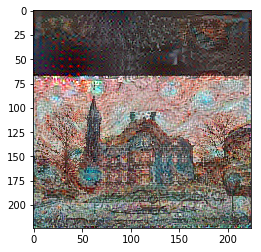

variable(8.574936e+08)
981
cost
variable(8.574936e+08)
iteration: 982 / 1000, loss: 857493632.0000
variable(8.5654074e+08)
982
cost
variable(8.5654074e+08)
iteration: 983 / 1000, loss: 856540736.0000
variable(8.557283e+08)
983
cost
variable(8.557283e+08)
iteration: 984 / 1000, loss: 855728320.0000
variable(8.5486874e+08)
984
cost
variable(8.5486874e+08)
iteration: 985 / 1000, loss: 854868736.0000
variable(8.540258e+08)
985
cost
variable(8.540258e+08)
iteration: 986 / 1000, loss: 854025792.0000
variable(8.5317024e+08)
986
cost
variable(8.5317024e+08)
iteration: 987 / 1000, loss: 853170240.0000
variable(8.5241715e+08)
987
cost
variable(8.5241715e+08)
iteration: 988 / 1000, loss: 852417152.0000
variable(8.515228e+08)
988
cost
variable(8.515228e+08)
iteration: 989 / 1000, loss: 851522816.0000
variable(8.5070726e+08)
989
cost
variable(8.5070726e+08)
iteration: 990 / 1000, loss: 850707264.0000
variable(8.498748e+08)
990
cost
variable(8.498748e+08)
iteration: 991 / 1000, loss: 849874816.0000


In [24]:
model.to_gpu(0)
model.gen_img(content_image,style_image,style,layer_name,max_iter)
   

## 5 - Test with your own image (10 bonus points)

Finally, you can also rerun the algorithm on your own images! 

You can also tune your hyperparameters: 
- Which layers are responsible for representing the style? STYLE_LAYERS
- How many iterations do you want to run the algorithm? num_iterations
- What is the relative weighting between content and style? alpha/beta

c:\users\avajang-pc\appdata\local\programs\python\python35\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  after removing the cwd from sys.path.


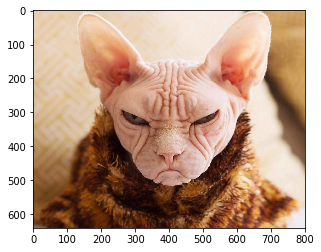

In [49]:
#from chainer.links import VGG16Layers
# 1. Load the content image

generated_image=generate_noise_image(scipy.misc.imread('cat.png'))

im = Image.open('cat.jpg')

im.save('cat.png', 'PNG')
im_content=Image.open('cat.png')
content_image,nw,nh=image_resize(im_content)
imshow(im_content)

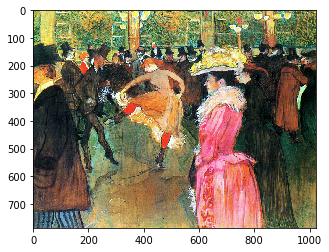

In [50]:
# 2. Load the style image
im = Image.open('lautrec-bal-moulin-rouge.jpg')
im.save('style_img.png', 'PNG')
im_style=Image.open('style_img.png')
style_image,_,_ = image_resize(im_style)
imshow(im_style)

In [40]:
# 3. Randomly initialize the image to be generated 




AttributeError: 'PngImageFile' object has no attribute 'shape'

In [52]:
# 5. Build a Chainer Model:

layer_name='conv3_1'
loss_history = []
model_directory = "Models"
lr=0.1 #learning rate
model=Generate_Image(generated_image)
model.vgg.to_gpu(0)

max_iter=1001

model.to_gpu(0)

model.gen_img(im_content,im_style,style,layer_name,max_iter)

InvalidType: 
Invalid operation is performed in: Convolution2DFunction (Forward)

Expect: in_types[0].ndim == 4
Actual: 3 != 4

InvalidType: 
Invalid operation is performed in: Convolution2DFunction (Forward)

Expect: in_types[0].ndim == 4
Actual: 3 != 4

## 7 - Conclusion

Great job on completing this assignment! You are now able to use Neural Style Transfer to generate artistic images. This is also your first time building a model in which the optimization algorithm updates the pixel values rather than the neural network's parameters. Deep learning has many different types of models and this is only one of them! 

<font color='blue'>
What you should remember:
- Neural Style Transfer is an algorithm that given a content image C and a style image S can generate an artistic image
- It uses representations (hidden layer activations) based on a pretrained ConvNet. 
- The content cost function is computed using one hidden layer's activations.
- The style cost function for one layer is computed using the Gram matrix of that layer's activations. The overall style cost function is obtained using several hidden layers.
- Optimizing the total cost function results in synthesizing new images.

### References:

The Neural Style Transfer algorithm was due to Gatys et al. (2015). Harish Narayanan and Github user "log0" also have highly readable write-ups from which we drew inspiration. The pre-trained network used in this implementation is a VGG network, which is due to Simonyan and Zisserman (2015).

- Leon A. Gatys, Alexander S. Ecker, Matthias Bethge, (2015). A Neural Algorithm of Artistic Style (https://arxiv.org/abs/1508.06576) 
- Harish Narayanan, Convolutional neural networks for artistic style transfer. https://harishnarayanan.org/writing/artistic-style-transfer/
- Log0, TensorFlow Implementation of "A Neural Algorithm of Artistic Style". http://www.chioka.in/tensorflow-implementation-neural-algorithm-of-artistic-style
- Karen Simonyan and Andrew Zisserman (2015). Very deep convolutional networks for large-scale image recognition (https://arxiv.org/pdf/1409.1556.pdf)